# **Deep Learning Classifiers For Urban Sound Data** 

 ### **Assigment for Machine Learning II Class**

**Work developed by Alexandre Sousa, Marta Longo e Sara Táboas**

### **Table of Contents:**
1. [Introduction](#Introduction)
2. [Libraries](#libraries)
3. [UrbanSound8k Dataset](#UrbanSound8k-Dataset)
4. [Data Pre-processing and Preparation](#Data-Pre-processing-and-Preparation)
5. [Models](#Models)

    5.1 [Multilayer Perceptron (MLP)](#Multilayer-Perceptron-(MLP))
    
    - [Description](#Description)
    - [Data preparation](#Data-preparation-for-MLP)
    - [Architecture](#Architecture)
    - [MLP Classifier](#MLP-Classifier)
    - [Hyperparameter Tuning](#Hyperparameter-Tuning)
    - [Training strategies](#Training-strategies)
    - [Cross Validation](#Cross-Validation)
    

    5.2 [Convolutional Neural Network (CNN)](#Convolutional-Neural-Network-(CNN))

    - [Description](#Description)
    - [Data preparation](#Data-preparation-for-CNN)
    - [Architecture](#Architecture)
    - [CNN Classifier](#CNN-Classifier)
    - [Hyperparameter Tuning](#Hyperparameter-Tuning)
    - [Training strategies](#Training-strategies)
    - [Cross Validation](#Cross-Validation)
    - [Comparison between CNN models](#Comparison-between-CNN-models)
        

6. [DeepFool](#DeepFoo,)

    6.1 [DeepFool on MLP](#DeepFool-on-MLP)
    
    6.2 [DeepFool  on CNN](#DeepFool-on-CNN)
7. [Results and Analysis](#Results-and-Analysis)
8. [References](#References)

### **Introduction** <a class="anchor" id="Introduction"></a>
[Back to Table of Contents](#Table-of-Contents)

The purpose of this assigment is to develop deep learning classifiers with urban sound data. The dataset used for this project is the **urbansound8k dataset** *(add link to references)* and the neural networks choosen to be used as classifiers were **MultiLayer Perception** (MLP) and **Convolutional Neural Network** (CNN).

### **Libraries**  <a name ="libraries"></a>
[Back to Table of Contents](#Table-of-Contents)

In [ ]:
import re
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import os
import soundfile as sf
import librosa
import random
import torch
from sklearn.preprocessing import MinMaxScaler
from neural_networks import CNN_Class
import tensorflow as tf
from sklearn.model_selection import ParameterGrid
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.metrics import confusion_matrix, classification_report
from neural_networks import MLPClassifier
import matplotlib.pyplot as plt
from utils import *
import librosa.display
import matplotlib.image as mpimg

### **UrbanSound8K Dataset** <a id="UrbanSound8k-Dataset"></a>
[Back to Table of Contents](#Table-of-Contents)


The dataset, UrbanSound, contains 27 hours of audio with 18.5 hours of annotated sound event occurances across 10 sound classes. 

The dataset was collected from annotated urban sounds including 10 low-level classes from taxonomy: 
air conditioner, car horn, children playing, dog bark, drilling, engine idling, gun shot, jackhammer, siren and street music. With the exception of "children playing and "gun shot", which were added for variety, all other classes were selected due to the high frequency in which they appear in urban noise complaints. 

In a study, the authors conducted a listening test and found that 4 seconds were sufficient for subjects to identify environmental sounds with 82% accuracy, and consequently use a 4 second clip durantion in their experiments with automatic classification. Following their finding, they set a maximum occurance duration limit of 4 seconds, and segment longer occurrences into 4 s slices using a sliding window with a hop size of 2 s. To avoid large differences in the class distribution, they set a limit of 1000 slices per class, resulting in a total 8732 labeled slices ( 8.75 hours).

### **Data Pre-processing and Preparation**
[Back to Table of Contents](#Table-of-Contents)

First, we're going to check if the audios have differences in their durations and sample rate. This is important because Neural Networks work better when the input data have consistent sizes. 

In [ ]:
#Loading the audio files
dataset_path = ("/Users/sarataboas/Desktop/fcup/3/1_semestre/aprendizagem_comp_2/dataset_soundata/audio")

Analysing the metadata file we can check the durations of the files as well as the classes they belong to:

In [ ]:
metadata = pd.read_csv("UrbanSound8K.csv")
metadata.head()

In [ ]:
fold_counts = metadata['fold'].value_counts()
total_files = fold_counts.sum()
print(f"\nTotal files on metadata: {total_files}")

The metadata file has 8732 audio files, so it matches with the download of the dataset, indicating that our download is compatible with the metadata.

In [ ]:
print("\nNumber of files per fold:")
print(metadata['fold'].value_counts())

In this dataset, the folds are pre-defined to balance the classes and facilitate the k-fold cross-validation. Therefore, it does not harm our data quality.

In [ ]:
fold_class_distribution = metadata.groupby(['fold', 'class']).size().unstack(fill_value=0)
fold_class_percentages = fold_class_distribution.div(fold_class_distribution.sum(axis=1),axis=0)*100
print(fold_class_percentages)

fold_class_percentages.plot(kind='bar', stacked=True, figsize=(12, 6), colormap="tab10")
plt.title("The percentage of each class in each fold:")
plt.xlabel("Fold")
plt.ylabel("Percentage (%)")
plt.legend(title="Class", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


Now, let's check the duration of the audio files across the entire dataset to understand the differences. The following code calculates the durations of all the files listed in the metadata and presents the results:

Duration Statistics:
          Duration
count  8732.000000
mean      3.607522
std       0.974394
min       0.050000
25%       4.000000
50%       4.000000
75%       4.000000
max       4.036647


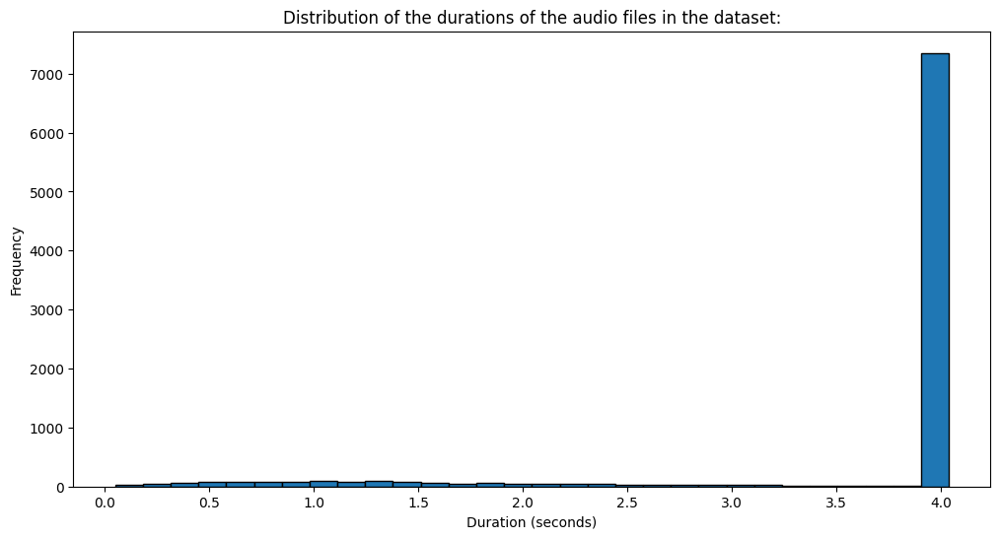

In [7]:
durations = []

# Iterate through the metadata
for _, row in metadata.iterrows():
    fold = row['fold']  # Identify the fold
    file_name = row['slice_file_name']  # Audio file name
    
    # Full path of the audio file
    file_path = os.path.join(dataset_path, f"fold{fold}", file_name)
    
    try:
        audio, sr = librosa.load(file_path, sr=None)  # Load the audio file
        duration = librosa.get_duration(y=audio, sr=sr)  # Get the duration of the audio
        durations.append(duration)
    except Exception as e:
        print(f"Error processing {file_path}: {e}")

# Basic statistics of the durations
durations_df = pd.DataFrame(durations, columns=["Duration"])
print("Duration Statistics:")
print(durations_df.describe())

# Visualize the distribution of durations
plt.figure(figsize=(12, 6))
plt.hist(durations, bins=30, edgecolor="black")
plt.title("Distribution of the durations of the audio files in the dataset:")
plt.xlabel("Duration (seconds)")
plt.ylabel("Frequency")
plt.show()

    

The average duration is 3.61 seconds, and the median is 4 seconds, which indicates that most of the files are around 4 seconds long.
The minimum is 0.05 seconds, suggesting the presence of outliers (very short files).
The maximum is 4.03 seconds, which is close to the typical value of 4 seconds.



Let's analyze the relative sampling rate of each audio in the dataset.

The **sampling rate** is the number of samples captured per second from a continuous signal (in this case, digital audio). It is measured in Hertz (Hz).

A higher sampling rate captures more details of the sound, while a lower sampling rate reduces quality (but saves storage space).

To train a neural network, all inputs must have the same format, including the same sampling rate. Differences in sampling rate can lead to distortions or inconsistencies in the data.


In [8]:
# List to store the sampling rates
sampling_rates = []

# Iterate through the audio files in the metadata
for _, row in metadata.iterrows():
    fold = row['fold']  # Identify the fold
    file_name = row['slice_file_name']  # Audio file name
    
    # Full path of the audio file
    file_path = os.path.join(dataset_path, f"fold{fold}", file_name)
    
    try:
        # Load the audio file to get the sampling rate
        audio, sr = librosa.load(file_path, sr=None)
        sampling_rates.append(sr)
    
    except Exception as e:
        print(f"Error processing {file_path}: {e}")

# Analyzing Unique Sampling Rates
unique_sampling_rates = set(sampling_rates)
print("Unique Sampling Rates:")
print(unique_sampling_rates)

# Sampling Rate statistics
print(f"Total number of files: {len(sampling_rates)}")
print(f"Most common sampling rate: {max(set(sampling_rates), key=sampling_rates.count)}")


Unique Sampling Rates:
{48000, 96000, 22050, 16000, 44100, 192000, 32000, 24000, 8000, 11024, 11025}
Total number of files: 8732
Most common sampling rate: 44100


 

Although we have good results in this analysis, we need to guarantee that our neural network train is consistent, therefore we will proceed to uniformize the duration and normalize the volume.

To avoid a significant reduction in information, we will focus on handling the data with a duration of 4 seconds and a sampling rate of 44100 Hz. Since the Librosa library automatically handles this conversion, we will proceed to the feature extraction phase and process the data accordingly.


### **Feature Extraction**

The functions in the `utils.py` file are designed to extract audio features using 'librosa' and save them into CSV files (in the case of the MLP), organized by folds.

This `utils.py` file contains 3 functions, one of them is the **extract_features** that is responsible for extracting a series of audio features from each .wav file. This is where the conversion of duration time and resampling is done.

The extracted features are:

-> **Spectral Features**:

   - **chroma_stft, chroma_cqt, chroma_cens**: Characterize the harmonic content based on pitch.
   - **melspectrogram**: A representation based on mel scales, useful for perceptual frequency analysis.
   - **mfcc**: Mel-frequency cepstral coefficients, which capture essential spectral patterns for classification.
   - **rms**: Root mean square, representing the energy of the signal.
   - **centroid, bandwidth, contrast, flatness, rolloff**: Various metrics to describe the spectral distribution.
   - **crossing_rate**: Measures the zero-crossing rate of the signal.

-> **Rhythmic Features**:

   - **tempogram and fourier_tempogram**: Represent temporal patterns based on onset events.

-> **Mean Calculation**:
   For each extracted feature, the mean is calculated over time, generating numerical values that represent the audio as a fixed-length vector.


### **Models**

#### **MultiLayer Percepton (MLP)**

**Description**

A **multilayer perceptron (MLP)** is a type of artificial neural network composed of multiple layers of interconnected nodes, also called neurons. It typically consists of an input layer that accepts the input features of the data, one or more hidden layers where neurons apply activation functions to transform the inputs into more complex representations, and an output layer that produces the final prediction or classification result.

Key features of an MLP include fully **connected layers**, where every neuron in one layer is connected to all neurons in the next, and non-linearity, as **activation functions** (such as ReLU or sigmoid) are used to capture complex patterns. During training, the network learns the weights of the neurons using backpropagation and optimization algorithms like gradient descent.

The strengths of MLPs include their ability to model non-linear and complex relationships, making them effective for simpler tasks like classification and regression. They also serve as the foundation for more advanced architectures, such as Convolutional Neural Networks (CNNs). However, MLPs have limitations, such as struggling with high-dimensional data like images or sequential data without significant preprocessing. They also require careful tuning of hyperparameters (e.g., number of layers, neurons, learning rate) and can be computationally expensive for large-scale problems compared to more specialized architectures.

<div style="display: flex; justify-content: center; align-items: center;">
    <img src="mlp.png" width="400">
</div>


**Data preparation for MLP** 

In order to prepare the data for the MLP model, the strategy chosen was to extract the features from the audio files and store them in CSV files. As there were 10 folds in the original dataset, the features were extracted for each fold separately. Each fold is, then, represented as a unique CSV file.

<div style="text-align: center; color: lightblue; font-weight: bold;">
utils.process_data(base_dir)
</div>


**1.** **Load Audio Files**

Each audio file of the UrbanSound8K dataset is loaded using librosa, resampled to a target sampr rate of 44,100Hz and truncated to a fized duration of 4 seconds. Same length of audio samples is critical for feature extraction and model training.

**2.** **Feature extraction**

Using librosa, various audio features were extracted from the .wav files, including:
- Sepctral Features : Mel-frequency cepstral coefficients (MFCCs), spectral centroid, spectral contrast, spectral rolloff, and zero-crossing rate.
- Chroma Features: Chroma STFT and Chroma CQT.
- Energy Features: RMS energy and spectral bandwidth

Since the audio features are represented by two-dimensional arrays, the mean value of each one was chosen to create a feature vector for each audio file. By doing this, it can be ensured a fixed-size input for the MLP model.


<div style="text-align: center; color: lightblue; font-weight: bold;">
utils.extract_features(audio_file)
</div>


**3.** **Normalization**
All values are normalized to the range [0,1] to ensure that the model can learn effectively and improve its performance.

A list was created with the 10 datasets, one for each fold:

In [9]:
datasets = [pd.read_csv(f'data/urbansounds_featuresfold{i}.csv') for i in range(1, 11)]

It was verified that were no NAN's and almost every column type is float, except for the **fourier_tempogram_mean** feature and the **Label**.

This means that data needed to be normalized.

In [10]:
for i, df in enumerate(datasets):
    print(f"Dataset {i+1} shape: {df.shape}")
    print("Column Data Types and NaN Counts:")
    
    # Display data type and NaN counts for each column
    for column in df.columns:
        dtype = df[column].dtype
        nan_count = df[column].isna().sum()
        print(f"  - {column}: Type={dtype}, NaNs={nan_count}")

Dataset 1 shape: (873, 54)
Column Data Types and NaN Counts:
  - chroma_stft_mean: Type=float64, NaNs=0
  - chroma_cqt_mean: Type=float64, NaNs=0
  - chroma_cens_mean: Type=float64, NaNs=0
  - melspectogram_mean: Type=float64, NaNs=0
  - rms_mean: Type=float64, NaNs=0
  - centroid_mean: Type=float64, NaNs=0
  - bandwidth_mean: Type=float64, NaNs=0
  - contrast_mean: Type=float64, NaNs=0
  - flatness_mean: Type=float64, NaNs=0
  - rolloff_mean: Type=float64, NaNs=0
  - crossing_rate_mean: Type=float64, NaNs=0
  - tempogram_mean: Type=float64, NaNs=0
  - fourier_tempogram_mean: Type=object, NaNs=0
  - mfcc_1_mean: Type=float64, NaNs=0
  - mfcc_2_mean: Type=float64, NaNs=0
  - mfcc_3_mean: Type=float64, NaNs=0
  - mfcc_4_mean: Type=float64, NaNs=0
  - mfcc_5_mean: Type=float64, NaNs=0
  - mfcc_6_mean: Type=float64, NaNs=0
  - mfcc_7_mean: Type=float64, NaNs=0
  - mfcc_8_mean: Type=float64, NaNs=0
  - mfcc_9_mean: Type=float64, NaNs=0
  - mfcc_10_mean: Type=float64, NaNs=0
  - mfcc_11_mean

It was verified that were no NAN's and almost every column type is float, except for the **fourier_tempogram_mean** feature and the **Label**. Therefore, this data needed to be normalized.

In [11]:
for i, df in enumerate(datasets):
    print(f"Dataset {i+1}")
    
    # Select object-type columns
    object_columns = df.select_dtypes(include=['object']).columns
    
    # Print contents of each object-type column
    for column in object_columns:
        print(f"\nContents of '{column}' column:")
        print(df[column].head())  # Using .head() to show the first few rows
        
    print("\n" + "-" * 40 + "\n")

Dataset 1

Contents of 'fourier_tempogram_mean' column:
0     (0.44404131174087524-0.002970917848870158j)
1      (0.14342786371707916-0.05513746291399002j)
2     (0.4428422451019287-0.0006598465261049569j)
3    (0.39682629704475403+0.0004954273463226855j)
4      (0.3015442490577698-0.035141970962285995j)
Name: fourier_tempogram_mean, dtype: object

Contents of 'Label' column:
0    135776-2-0-49.wav
1      46654-6-0-0.wav
2     57320-0-0-24.wav
3    134717-0-0-26.wav
4     174276-7-5-0.wav
Name: Label, dtype: object

----------------------------------------

Dataset 2

Contents of 'fourier_tempogram_mean' column:
0     (0.4022315442562103+0.0012268945574760437j)
1    (0.4768637716770172+0.00011315011943224818j)
2     (0.5803484916687012-0.0020995864178985357j)
3    (0.4334917366504669+0.00013695459347218275j)
4        (0.449008971452713-0.02257539890706539j)
Name: fourier_tempogram_mean, dtype: object

Contents of 'Label' column:
0    203929-7-5-1.wav
1    196384-9-0-2.wav
2    169098-7

**fourier_tempogram_mean normalization**:  this feature is represented by a string, that represents a complex number, because it's derived from the Fourier Transformation of the audio signal. It captures the rythmic and tempo information iver time, and it uses the complex format to represent both the magnitude and phase of the rythmic components of the signal. Those values appeared in our datasets in a string format. These values were not useful for the model, so we created 2 columns for each part (real and imaginary) of the complex numbers. 


In [12]:
# Extract real and imaginary parts of the complex numbers
for i, df in enumerate(datasets):
    print(f"Dataset {i+1}")
    df['fourier_tempogram_mean'] = df['fourier_tempogram_mean'].apply(lambda x: complex(x))
    df['real_part'] = df['fourier_tempogram_mean'].apply(lambda x: x.real)
    df['imaginary_part'] = df['fourier_tempogram_mean'].apply(lambda x: x.imag)
    df.drop(columns=['fourier_tempogram_mean'], inplace = True)
    df[['real_part', 'imaginary_part']]
    


Dataset 1
Dataset 2
Dataset 3
Dataset 4
Dataset 5
Dataset 6
Dataset 7
Dataset 8
Dataset 9
Dataset 10


After this, we needed to merge the datasets with the metadata dataset so we could add the label to the correspondent audio file name.

In [13]:
for i, df in enumerate(datasets):
    print(f"Dataset {i+1}")

    # Garantir que 'slice_file_name' no metadata seja string
    metadata['slice_file_name'] = metadata['slice_file_name'].astype(str)

    # Renomear a coluna 'Label' para 'slice_file_name'
    df.rename(columns={'Label': 'slice_file_name'}, inplace=True)

    # Garantir que 'slice_file_name' no df seja string
    df['slice_file_name'] = df['slice_file_name'].astype(str)

    # Fazer o merge
    merged_dataset = df.merge(metadata[['slice_file_name', 'classID']], on='slice_file_name')

    # Substituir a última coluna pela coluna 'classID'
    merged_dataset = merged_dataset.drop(columns=['slice_file_name'])
    merged_dataset = merged_dataset.rename(columns={'classID': 'Label'})  # Opcional: renomear 'classID'

    # Normalizar todas as colunas menos a última
    scaler = MinMaxScaler()
    features_to_normalize = merged_dataset.columns[:-1]  # Excluir a última coluna
    merged_dataset[features_to_normalize] = scaler.fit_transform(merged_dataset[features_to_normalize])
    

    # Salvar o novo dataset
    merged_dataset.to_csv(f"data/updated_dataset{i+1}.csv", index=False)

    print(f"Dataset {i+1} saved successfully.")

Dataset 1
Dataset 1 saved successfully.
Dataset 2
Dataset 2 saved successfully.
Dataset 3
Dataset 3 saved successfully.
Dataset 4
Dataset 4 saved successfully.
Dataset 5
Dataset 5 saved successfully.
Dataset 6
Dataset 6 saved successfully.
Dataset 7
Dataset 7 saved successfully.
Dataset 8
Dataset 8 saved successfully.
Dataset 9
Dataset 9 saved successfully.
Dataset 10
Dataset 10 saved successfully.


In [14]:
# Normalized datasets
datasets = [pd.read_csv(f'/Users/sarataboas/Desktop/fcup/3/1_semestre/aprendizagem_comp_2/urban-sound-data-deep-learning/data/updated_dataset{i}.csv') for i in range(1, 11)]

**Architecture**

The MLP model architecture includes the definition of the number of layers, number of neurons of each layer and the choice of the activation functions to adopt at each layer.

To optimize performance, different configurations of the number of layers and neurons were tested (explained in the hyperparameter tuning section), while the activation functions remained fixed. The Rectified Linear Unit (ReLU) activation function was chosen for the hidden layers due to its computational efficiency and ability to mitigate the vanishing gradient problem, making it highly suitable for deep learning models.

For the output layer, the softmax activation function was used as it normalizes the outputs into a probability distribution across multiple classes. This choice is essential for multi-class classification problems, as it allows the model to predict the likelihood of each class and ensures that the outputs sum to 1, enabling straightforward interpretation and decision-making.

<div style="display: flex; justify-content: center; align-items: center; gap: 30px;">
    <img src="relu_activation_function.png" alt="ReLU Activation Function" width="275">
    <img src="softmax_activation_function.png" alt="Softmax Activation Function" width="300">
</div>


**MLP Classifier**

The MLP classifier was implemented using the Keras library, which provides a high-level neural network API for building and training models. The model was compiled with the categorical cross-entropy loss function, which is suitable for multi-class classification tasks, and the Adam optimizer, a popular choice for its adaptive learning rate and efficiency in training deep learning models.

The implementation of this classifier includes the following steps:

- **Architecture Design:** The model consists of an input layer, one or more hidden layers, and an output layer. Each hidden layer applies the Rectified Linear Unit (ReLU) activation function for non-linearity and uses L2 regularization to mitigate overfitting by penalizing large weights. Dropout layers are added after each dense layer to further reduce overfitting by randomly setting a fraction of input units to zero during training. The output layer employs the softmax activation function, providing probability distributions across the 10 classes in the dataset.


- **Training Strategy:** The model is compiled with the Sparse Categorical Cross-Entropy loss function, suitable for integer-labeled multi-class problems. The Adam optimizer is utilized for its efficiency and adaptive learning rate capabilities, ensuring faster convergence during training. Early stopping is implemented to monitor validation loss, halting training when no improvement is observed for a defined number of epochs (patience parameter). This prevents overfitting and reduces unnecessary computational costs.

- **Evaluation Metrics:** The training and validation accuracy and loss are tracked during each epoch, providing insights into the model's performance over time. A confusion matrix is generated post-training to visualize the model's performance on the test set, highlighting its ability to correctly classify sounds into distinct categories.

- **Visualization:** Training progress is visualized through accuracy and loss plots, offering a clear understanding of the model's learning dynamics. The confusion matrix, plotted with Seaborn, gives an intuitive overview of classification results across all classes.


(MLP_TF file in Neural Networks folder)

In [15]:
mlp = MLPClassifier(input_shape=(datasets[0].shape[1]-1), params=None)

MLP Model initialized successfully with input shape: 54


**Hyperparameter Tuning**

Hyperparameter tuning was performed to optimize the MLP model by evaluating various configurations of key parameters. The tuning process explored a range of values for the number of hidden layers, the number of neurons per layer, learning rates, dropout rates, batch sizes, optimizers, and L2 regularization strength. 

To identify the best combination of hyperparameters/architecture, a grid search was conducted on the params dictionary presented below. This approach systematically tests different parameter values and evaluates their impact on model performance, by evaluating each model's validation loss. The best model configuration was selected based on the lowest validation loss, indicating the highest accuracy and generalization ability.

These tests were all performed using the first fold of the datasets as the test set, the second fold as the validation set and the remaining folds as the training set, simulating the first iteration of the k-fold cross-validation.


<div style="text-align: center; color: lightblue; font-weight: bold;">
utils.param_tuning_mlp(datasets, param, model)
</div>


In [16]:
params_mlp = {
'hidden_layers': [                              # Different hidden layers with different number of neurons
    [128, 64],
    [256, 128],
    [512, 256, 128], 
    [256, 128, 64], 
    [128, 64, 32]
],                                              
'learning_rate': [0.001, 0.0001, 0.00001],      # Different learning rates
'dropout_rate': [0.2, 0.3, 0.5],                # Different dropout rates
'optimizer': [tf.keras.optimizers.Adam],        # Optimizers to test
'epochs': [50],                                 # Number of epochs for training
'batch_size': [256, 32],                        # Different batch sizes
'l2_lambda': [0.001, 0.01, 0.1]                 # Weight regularizer L2 parameter
}

In [17]:
# best_params = param_tuning_mlp(datasets, mlp, params_mlp)

In [18]:
best_params = {'batch_size': 32, 'dropout_rate': 0.2, 'epochs': 50, 'hidden_layers': [256, 128], 'l2_lambda': 0.001, 'learning_rate': 0.0001, 'optimizer':tf.keras.optimizers.Adam}
print("Best parameters: ", best_params)

Best parameters:  {'batch_size': 32, 'dropout_rate': 0.2, 'epochs': 50, 'hidden_layers': [256, 128], 'l2_lambda': 0.001, 'learning_rate': 0.0001, 'optimizer': <class 'keras.src.optimizers.adam.Adam'>}


**Training Strategies**

The training strategy for the MLP model includes the following components:
- **Early Stopping:** The model is trained with early stopping to prevent overfitting and reduce computational costs. The training process monitors the validation loss and halts when no improvement is observed for 5 epochs (patience parameter).

- **Weight Regularization:** L2 regularization is applied to the hidden layers to penalize large weights and prevent overfitting. This regularization term is added to the loss function, encouraging the model to learn simpler patterns and generalize better to unseen data. The lambda value used is defined in the hyperparameter tuning section.

- **Dropout:** Dropout layers are inserted after each dense layer to reduce overfitting by randomly setting a fraction of input units to zero during training. This technique improves the model's generalization ability and robustness by preventing co-adaptation of neurons and promoting feature learning.

**Cross Validation**

In order to train and evaluate the MLP model, a 10-fold cross-validation strategy was adopted. This approach divides the dataset into 10 subsets (folds), trains the model on 8 folds using 1 fold as the validation set and evaluates it on the remaining fold, test fold. This process is repeated 10 times, with each fold serving as the test set once. Before training each iteration of the cross-validation, the model is completely reseted, to ensure that the test fold is never seen during training. It were used the same hyperparameters found in the training process and the performance is measured with accuracy and loss metrics.

Each fold plots the training and validation loss and accuracy (learning curves). The average accuracy and loss are also calculated to provide a summary of the model's overall performance. There is also plotted the confusion matrix, which shows the distribution of true positive, true negative, false positive, and false negative predictions across the classes.



<div style="text-align: center; color: lightblue; font-weight: bold;">
utils.cross_validation_mlp(datasets, param, model)
</div>


Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.5568138360977173, 'loss': 1.517674446105957, 'val_accuracy': 0.5281531810760498, 'val_loss': 1.466238021850586}
Epoch 20/50 - {'accuracy': 0.6388853788375854, 'loss': 1.2844074964523315, 'val_accuracy': 0.6801801919937134, 'val_loss': 1.1676558256149292}
Epoch 30/50 - {'accuracy': 0.6838020086288452, 'loss': 1.163758635520935, 'val_accuracy': 0.7297297120094299, 'val_loss': 1.0247108936309814}
Epoch 40/50 - {'accuracy': 0.7193027138710022, 'loss': 1.0725352764129639, 'val_accuracy': 0.7815315127372742, 'val_loss': 0.9309764504432678}
Epoch 50/50 - {'accuracy': 0.7416974306106567, 'loss': 1.0108246803283691, 'val_accuracy': 0.8243243098258972, 'val_loss': 0.8702625632286072}
Training completed.
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - accuracy: 0.4999 - loss: 1.7213
Test Loss: 1.6836, Test Accuracy: 51.20%
Predicting:  (873, 54)
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 

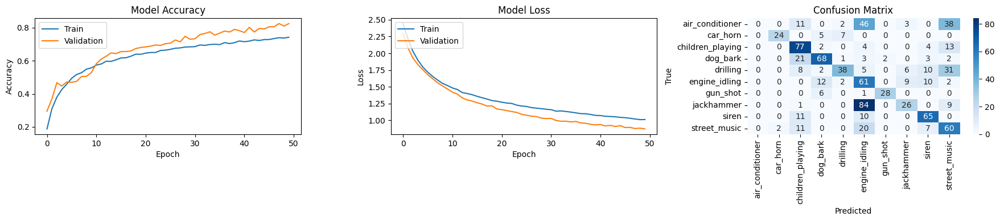

Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.5606833100318909, 'loss': 1.4982720613479614, 'val_accuracy': 0.6183784008026123, 'val_loss': 1.378907561302185}
Epoch 20/50 - {'accuracy': 0.6389597058296204, 'loss': 1.2814046144485474, 'val_accuracy': 0.6951351165771484, 'val_loss': 1.1648006439208984}
Epoch 30/50 - {'accuracy': 0.6746557950973511, 'loss': 1.162398338317871, 'val_accuracy': 0.7178378105163574, 'val_loss': 1.0701823234558105}
Epoch 40/50 - {'accuracy': 0.712519109249115, 'loss': 1.0847257375717163, 'val_accuracy': 0.7427027225494385, 'val_loss': 0.9813545346260071}
Epoch 50/50 - {'accuracy': 0.7285823822021484, 'loss': 1.0086281299591064, 'val_accuracy': 0.7794594764709473, 'val_loss': 0.9221222996711731}
Training completed.
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - accuracy: 0.4688 - loss: 1.7648
Test Loss: 1.6402, Test Accuracy: 50.68%
Predicting:  (888, 54)
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 

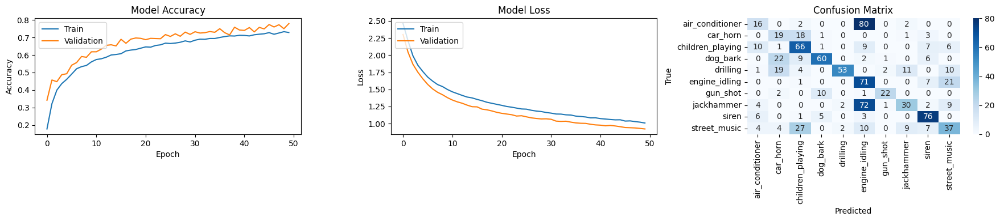

Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.5492506623268127, 'loss': 1.5214276313781738, 'val_accuracy': 0.6151515245437622, 'val_loss': 1.4521621465682983}
Epoch 20/50 - {'accuracy': 0.6417317986488342, 'loss': 1.279737949371338, 'val_accuracy': 0.7060605883598328, 'val_loss': 1.2027087211608887}
Epoch 30/50 - {'accuracy': 0.6868194937705994, 'loss': 1.1562150716781616, 'val_accuracy': 0.7616161704063416, 'val_loss': 1.083397626876831}
Epoch 40/50 - {'accuracy': 0.7151274681091309, 'loss': 1.0764662027359009, 'val_accuracy': 0.7808080911636353, 'val_loss': 0.9903982877731323}
Epoch 50/50 - {'accuracy': 0.7376713156700134, 'loss': 1.0032551288604736, 'val_accuracy': 0.800000011920929, 'val_loss': 0.9213764071464539}
Training completed.
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 268us/step - accuracy: 0.5541 - loss: 1.5100
Test Loss: 1.6142, Test Accuracy: 52.43%
Predicting:  (925, 54)
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 

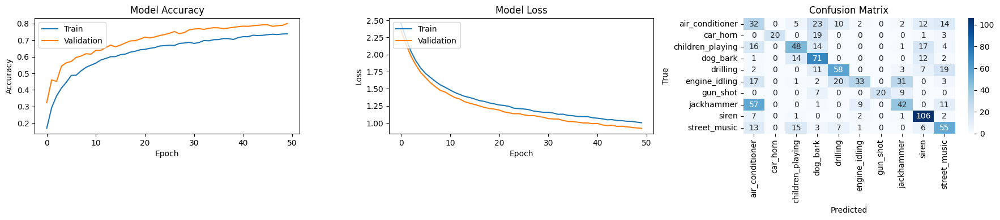

Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.5505037307739258, 'loss': 1.5092759132385254, 'val_accuracy': 0.5940170884132385, 'val_loss': 1.3873388767242432}
Epoch 20/50 - {'accuracy': 0.6415655016899109, 'loss': 1.275345802307129, 'val_accuracy': 0.7008547186851501, 'val_loss': 1.1509207487106323}
Epoch 30/50 - {'accuracy': 0.6872901320457458, 'loss': 1.1516324281692505, 'val_accuracy': 0.7382478713989258, 'val_loss': 1.0406997203826904}
Epoch 40/50 - {'accuracy': 0.7136399149894714, 'loss': 1.067211627960205, 'val_accuracy': 0.7756410241127014, 'val_loss': 0.9474146962165833}
Epoch 50/50 - {'accuracy': 0.7309480905532837, 'loss': 1.006771206855774, 'val_accuracy': 0.807692289352417, 'val_loss': 0.8826846480369568}
Training completed.
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 264us/step - accuracy: 0.5737 - loss: 1.5555
Test Loss: 1.4780, Test Accuracy: 60.71%
Predicting:  (990, 54)
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5

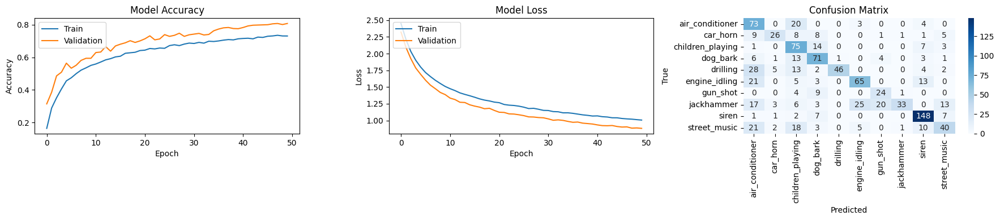

Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.5534889698028564, 'loss': 1.5050179958343506, 'val_accuracy': 0.6269744634628296, 'val_loss': 1.4899770021438599}
Epoch 20/50 - {'accuracy': 0.6446895599365234, 'loss': 1.272206425666809, 'val_accuracy': 0.6549209952354431, 'val_loss': 1.3100330829620361}
Epoch 30/50 - {'accuracy': 0.6848383545875549, 'loss': 1.1564809083938599, 'val_accuracy': 0.6682867407798767, 'val_loss': 1.211333155632019}
Epoch 40/50 - {'accuracy': 0.7133145332336426, 'loss': 1.07163667678833, 'val_accuracy': 0.7120291590690613, 'val_loss': 1.124337077140808}
Epoch 50/50 - {'accuracy': 0.7397383451461792, 'loss': 1.0073862075805664, 'val_accuracy': 0.7241798043251038, 'val_loss': 1.042604684829712}
Training completed.
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - accuracy: 0.6008 - loss: 1.4344
Test Loss: 1.4188, Test Accuracy: 58.01%
Predicting:  (936, 54)
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 629

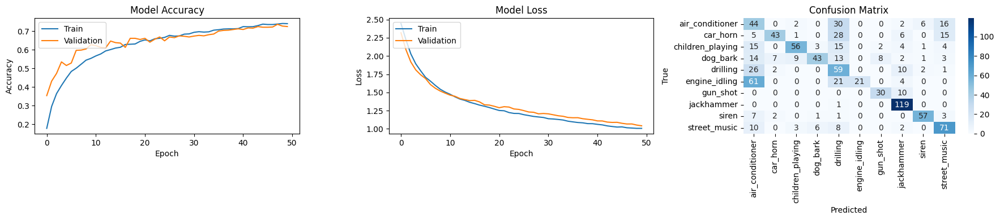

Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.546466052532196, 'loss': 1.494891881942749, 'val_accuracy': 0.5823389291763306, 'val_loss': 1.5447463989257812}
Epoch 20/50 - {'accuracy': 0.6396510601043701, 'loss': 1.2529675960540771, 'val_accuracy': 0.6443914175033569, 'val_loss': 1.2831472158432007}
Epoch 30/50 - {'accuracy': 0.6908585429191589, 'loss': 1.1348541975021362, 'val_accuracy': 0.7446300983428955, 'val_loss': 1.1098415851593018}
Epoch 40/50 - {'accuracy': 0.7180427312850952, 'loss': 1.0492351055145264, 'val_accuracy': 0.7577565908432007, 'val_loss': 1.0288304090499878}
Epoch 50/50 - {'accuracy': 0.7416867017745972, 'loss': 0.9867246150970459, 'val_accuracy': 0.79474937915802, 'val_loss': 0.9286774396896362}
Training completed.
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - accuracy: 0.6426 - loss: 1.4588
Test Loss: 1.6397, Test Accuracy: 59.66%
Predicting:  (823, 54)
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 6

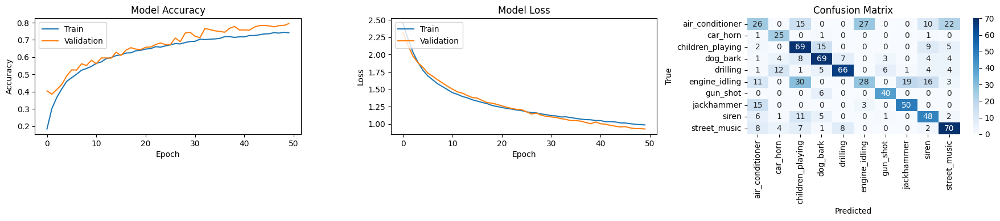

Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.548897922039032, 'loss': 1.506942868232727, 'val_accuracy': 0.655086874961853, 'val_loss': 1.3822051286697388}
Epoch 20/50 - {'accuracy': 0.6470737457275391, 'loss': 1.2687705755233765, 'val_accuracy': 0.7270471453666687, 'val_loss': 1.1960525512695312}
Epoch 30/50 - {'accuracy': 0.6801367998123169, 'loss': 1.1554492712020874, 'val_accuracy': 0.7468982338905334, 'val_loss': 1.111523985862732}
Epoch 40/50 - {'accuracy': 0.7068659663200378, 'loss': 1.0748956203460693, 'val_accuracy': 0.7555831074714661, 'val_loss': 1.050435185432434}
Epoch 50/50 - {'accuracy': 0.7330884337425232, 'loss': 1.013879656791687, 'val_accuracy': 0.7568238377571106, 'val_loss': 0.9921903014183044}
Training completed.
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - accuracy: 0.5539 - loss: 1.4943
Test Loss: 1.4786, Test Accuracy: 56.21%
Predicting:  (838, 54)
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 729

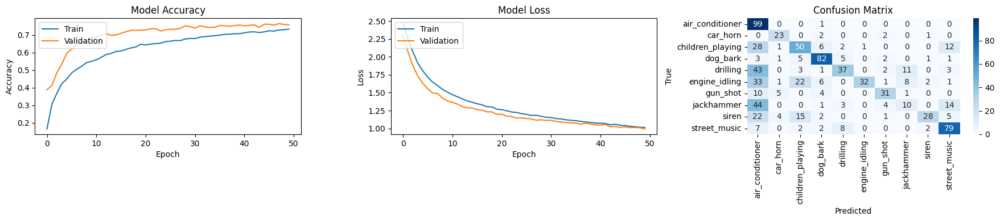

Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.5468079447746277, 'loss': 1.501043677330017, 'val_accuracy': 0.5906862616539001, 'val_loss': 1.4102331399917603}
Epoch 20/50 - {'accuracy': 0.6379005908966064, 'loss': 1.2666127681732178, 'val_accuracy': 0.6335784196853638, 'val_loss': 1.2412776947021484}
Epoch 30/50 - {'accuracy': 0.6869795322418213, 'loss': 1.141695499420166, 'val_accuracy': 0.6789215803146362, 'val_loss': 1.1412447690963745}
Epoch 40/50 - {'accuracy': 0.7128437757492065, 'loss': 1.0595229864120483, 'val_accuracy': 0.7144607901573181, 'val_loss': 1.0365954637527466}
Epoch 50/50 - {'accuracy': 0.7389603853225708, 'loss': 0.9904250502586365, 'val_accuracy': 0.7328431606292725, 'val_loss': 0.9654456377029419}
Training completed.
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - accuracy: 0.5510 - loss: 1.5754
Test Loss: 1.4965, Test Accuracy: 56.20%
Predicting:  (806, 54)
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s

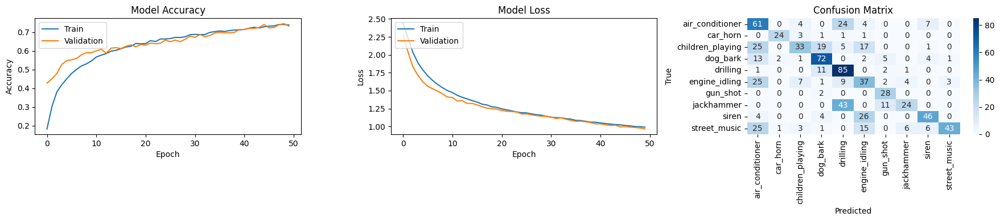

Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.5563415884971619, 'loss': 1.4905178546905518, 'val_accuracy': 0.6200717091560364, 'val_loss': 1.3744150400161743}
Epoch 20/50 - {'accuracy': 0.6479282379150391, 'loss': 1.2611839771270752, 'val_accuracy': 0.6869773268699646, 'val_loss': 1.1577701568603516}
Epoch 30/50 - {'accuracy': 0.6824153661727905, 'loss': 1.1574466228485107, 'val_accuracy': 0.7264038324356079, 'val_loss': 1.0444692373275757}
Epoch 40/50 - {'accuracy': 0.7047751545906067, 'loss': 1.080573558807373, 'val_accuracy': 0.7467144727706909, 'val_loss': 0.9817302823066711}
Epoch 50/50 - {'accuracy': 0.7366093993186951, 'loss': 1.0142210721969604, 'val_accuracy': 0.7550776600837708, 'val_loss': 0.9282269477844238}
Training completed.
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - accuracy: 0.4568 - loss: 1.9216
Test Loss: 1.9773, Test Accuracy: 47.43%
Predicting:  (816, 54)
26/26 ━━━━━━━━━━━━━━━━━━━━ 0

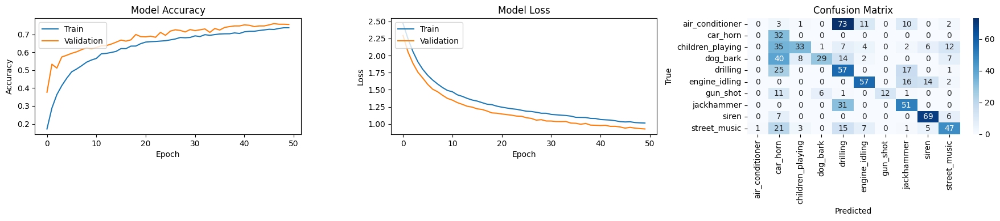

Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.6385998725891113, 'loss': 1.281917691230774, 'val_accuracy': 0.7319587469100952, 'val_loss': 1.0624661445617676}
Epoch 20/50 - {'accuracy': 0.7089673280715942, 'loss': 1.085835337638855, 'val_accuracy': 0.7823596596717834, 'val_loss': 0.8764199614524841}
Epoch 30/50 - {'accuracy': 0.7483611106872559, 'loss': 0.9694510102272034, 'val_accuracy': 0.831615149974823, 'val_loss': 0.7765380144119263}
Epoch 40/50 - {'accuracy': 0.7802369594573975, 'loss': 0.8784543871879578, 'val_accuracy': 0.8613975048065186, 'val_loss': 0.7158805131912231}
Epoch 50/50 - {'accuracy': 0.8061586618423462, 'loss': 0.8057640194892883, 'val_accuracy': 0.8831614851951599, 'val_loss': 0.6193462610244751}
Training completed.
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - accuracy: 0.7658 - loss: 0.8921
Test Loss: 0.8813, Test Accuracy: 76.58%
Predicting:  (837, 54)
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 

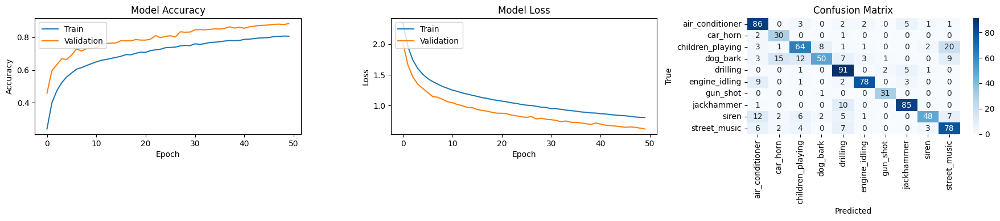

In [19]:
results_mlp = cross_validation_mlp(datasets, mlp, params=best_params)

Average of the Accuracy values: 0.5691087514162063
Average of the Loss values: 1.530821031332016


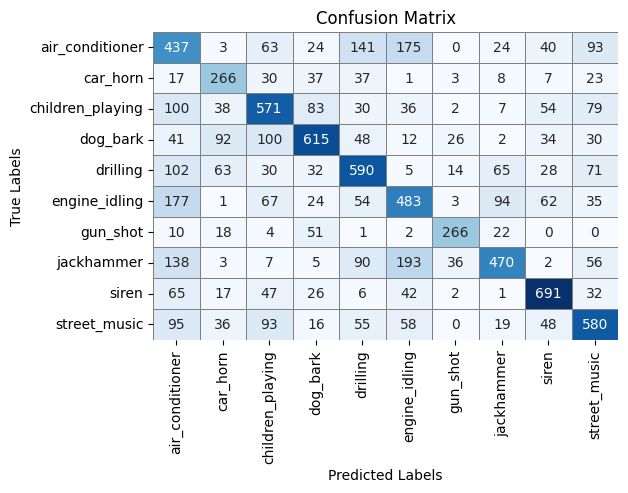

In [55]:
accuracy_values_mlp,loss_values_mlp, cumulative_matrix_mlp = results_mlp
print("Average of the Accuracy values:", np.mean(accuracy_values_mlp))
print("Average of the Loss values:", np.mean(loss_values_mlp))

# Plot cumulative confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cumulative_matrix_mlp, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 
                         'drilling', 'engine_idling', 'gun_shot', 'jackhammer', 'siren', 'street_music'],
            yticklabels=['air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 
                         'drilling', 'engine_idling', 'gun_shot', 'jackhammer', 'siren', 'street_music'],
            cbar=False, linewidths=0.5, linecolor='gray')
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

#### **Convolutional Neural Network - CNN**

[Back to Table of Contents](#Table-of-Contents)

**Description**

[Back to CNN](#Convolutional-Neural-Network-(CNN))

A **Convolutional Neural Network (CNN)** is a specialized type of neural network designed to process and analyze data with grid-like structures, such as images. It leverages spatial patterns and hierarchical representations to efficiently extract features. 

The key components of a CNN include **convolutional layers**, which apply filters (kernels) to input data to extract local patterns and reduce the number of parameters compared to fully connected layers. **Pooling layers** perform down-sampling to reduce spatial dimensions while retaining important information, with common methods including max pooling and average pooling. **Fully connected layers**, located at the end of the network, integrate the extracted features to make final predictions. **Activation functions**, like ReLU, introduce non-linearities to model complex patterns, while **dropout**, a regularization technique, randomly deactivates neurons to prevent overfitting.

CNNs have several key features, including translation invariance, which allows them to recognize patterns regardless of their position within the input (e.g., identifying objects anywhere in an image), and parameter sharing, where filters are reused across the input, making CNNs more efficient compared to traditional multilayer perceptrons (MLPs). Additionally, CNNs perform hierarchical feature extraction, capturing low-level details (like edges) in early layers and high-level abstractions (such as objects) in deeper layers.

CNNs are highly effective for image and video data, enabling tasks such as object detection, image classification, and facial recognition. They reduce computational complexity through parameter sharing and pooling, and are excellent at automatically extracting features without the need for manual preprocessing. However, they do have limitations: they require large amounts of labeled data for effective training, can be computationally intensive, particularly for deep architectures, and are less effective for non-grid-like data (such as structured numerical data).

<div style="display: flex; justify-content: center; align-items: center;">
    <img src="cnn.png" width="500">
</div>


**Data Preparation for CNN**

**1. Mel Spectogram Extraction**

A Mel spectrogram is a representation of audio that displays how the energy of different frequency bands changes over time, using the Mel scale to map frequencies. 
<div style="text-align: center; color: lightblue; font-weight: bold;">
utils.extract_spectogram(audio_path, target_duration=4.0, sr=22050, n_mels=128, hop_length=512)
</div>



In [56]:
fold_dir = ("/Users/sarataboas/Desktop/fcup/3/1_semestre/aprendizagem_comp_2/dataset_soundata/audio")
folds_data_mel = {}

for fold_name in os.listdir(fold_dir):
    fold_path = os.path.join(fold_dir, fold_name)
    if os.path.isdir(fold_path):
        spectrograms = []
        labels = []
        
        for audio_file in os.listdir(fold_path):
            if audio_file.endswith('.wav'):
                audio_path = os.path.join(fold_path,audio_file)
                
                spectrogram = extract_spectrogram(audio_path)
                spectrogram = librosa.util.fix_length(spectrogram, size=172, axis=1)
                spectrograms.append(spectrogram)
                
                label = int(audio_file.split("-")[1])
                labels.append(label)
    
            
        folds_data_mel[fold_name] = (np.array(spectrograms), np.array(labels))

/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1323
  warnings.warn(
/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1103
  warnings.warn(
/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1523
  warnings.warn(


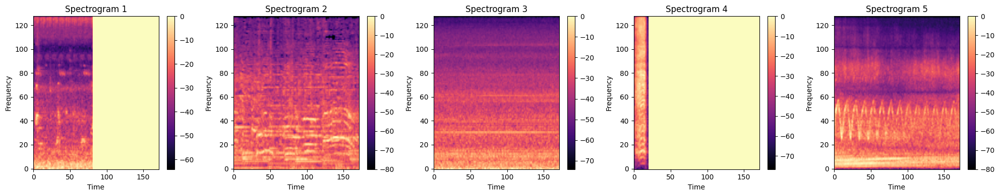

In [57]:
# Plot the first 5 spectrograms side by side using plot_spectrogram
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

for i in range(min(5, len(spectrograms))):
    ax = axes[i]
    plot_spectrogram(spectrograms[i], sr=22050, title=f"Spectrogram {i+1}", ax=ax)


plt.tight_layout()
plt.show()

**2. MFCC's Extraction**

MFCCs are a feature representation of audio signals that capture the spectral characteristics of the sound. 
<div style="text-align: center; color: lightblue; font-weight: bold;">
utils.extract_mfcc_features(audio_path, target_duration=4.0, sr=22050, n_mfcc=40, n_fft=2048, hop_length=512)
</div>

In [23]:
fold_dir = ("/Users/sarataboas/Desktop/fcup/3/1_semestre/aprendizagem_comp_2/dataset_soundata/audio")

folds_data_mfcc = {}

# Iterar pelos folds
for fold_name in os.listdir(fold_dir):
    fold_path = os.path.join(fold_dir, fold_name)
    if os.path.isdir(fold_path):
        mfcc_features = []
        labels = []

        # Iterar pelos ficheiros no fold
        for audio_file in os.listdir(fold_path):
            if audio_file.endswith('.wav'):
                audio_path = os.path.join(fold_path, audio_file)

                # Extrair os MFCCs
                mfcc = extract_mfcc_features(audio_path)
                mfcc = librosa.util.fix_length(mfcc, size=172, axis=1)  # Ajustar tamanho, se necessário
                mfcc_features.append(mfcc)
                

                # Extrair o rótulo do nome do ficheiro
                label = int(audio_file.split("-")[1])
                labels.append(label)

        # Armazenar no dicionário
        folds_data_mfcc[fold_name] = (np.array(mfcc_features), np.array(labels))


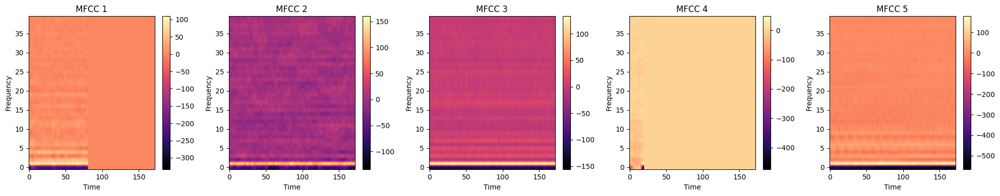

In [24]:
# Plot the first 5 spectrograms side by side using plot_spectrogram
fig, axes = plt.subplots(1, 5, figsize=(20, 4)) 

for i in range(min(5, len(mfcc_features))):
    ax = axes[i]
    plot_mfcc(mfcc_features[i], sr=22050, title=f"MFCC {i+1}", ax=ax)

plt.tight_layout()
plt.show()

**3. Chroma Features Extraction**

The chroma features in Librosa are representations of the harmonic characteristics of an audio signal, designed to capture musical information related to notes or chords. The central idea is that musical sounds can be decomposed into 12 pitch classes (notes), corresponding to the notes of the Western chromatic scale: C, C#, D, D#, E, F, F#, G, G#, A, A#, B.

These features are useful in tasks such as chord recognition, harmonic analysis, music identification, or even genre classification.

<div style="text-align: center; color: lightblue; font-weight: bold;">
utils.extract_mfcc_features(audio_path, target_duration=4.0, sr=22050, n_mfcc=40, n_fft=2048, hop_length=512)
</div>

In [48]:
fold_dir = ("/Users/sarataboas/Desktop/fcup/3/1_semestre/aprendizagem_comp_2/dataset_soundata/audio")

folds_data_chroma = {}

for fold_name in os.listdir(fold_dir):
    fold_path = os.path.join(fold_dir, fold_name)
    if os.path.isdir(fold_path):
        chromas = []
        labels = []
        
        #Iterar pelos ficheiros no fold
        for audio_file in os.listdir(fold_path):
            if audio_file.endswith('.wav'):
                audio_path = os.path.join(fold_path,audio_file)
                
                #Extrair o espectrograma
                chroma = extract_chroma_features(audio_path)
        
                chroma = librosa.util.fix_length(chroma, size=172, axis=1)
                chromas.append(chroma)
                
                #Extrair o rótulo do nome do ficheiro
                label = int(audio_file.split("-")[1])
                labels.append(label)
        
        #Armazenar no dicionário
        
        
        folds_data_chroma[fold_name] = (np.array(chromas), np.array(labels))
                
print("Dados processados para todos os folds")

/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1323
  warnings.warn(
/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1103
  warnings.warn(
/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1523
  warnings.warn(


Dados processados para todos os folds


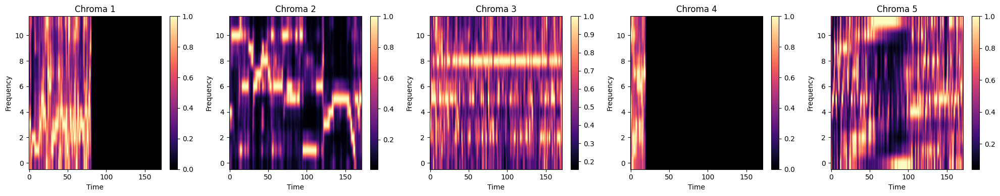

In [49]:
# Plot the first 5 spectrograms side by side using plot_spectrogram
fig, axes = plt.subplots(1, 5, figsize=(20, 4)) 

for i in range(min(5, len(chromas))):
    ax = axes[i]
    plot_mfcc(chromas[i], sr=22050, title=f"Chroma {i+1}", ax=ax)

plt.tight_layout()
plt.show()

**Architecture**

It was chosen a 2D CNN architecture, which is designed to work with 2D representations of audio signals. Our approach includes the CNN model with 3 different input types: Mel-spectogram, MFCC's and Chroma Features.

**CNN Classifier**

The CNN classifier was implemented using the Keras library, which offers a user-friendly API for building and training deep learning models. The model is compiled with the sparse categorical cross-entropy loss function, ideal for multi-class classification tasks, and the Adam optimizer, known for its adaptive learning rate and efficiency in training convolutional neural networks.
The implementation of this classifier includes the following steps:
- **Architecture Design:** The model consists of multiple convolutional layers followed by max-pooling layers, progressively increasing the number of filters at each layer to capture hierarchical features. The convolutional layers apply the ReLU activation function for non-linearity, and max-pooling reduces spatial dimensions while retaining the most important features. After the convolutional layers, the model flattens the feature maps and passes them through a dense layer with ReLU activation. A dropout layer is added to prevent overfitting by randomly setting input units to zero during training. The output layer uses the softmax activation function, which outputs probabilities across the specified number of classes.

- **Training Strategy:** The model is compiled with the sparse categorical cross-entropy loss function and optimized using the Adam optimizer for efficient training. Early stopping is used to monitor validation loss and stop training when no improvement is observed, preventing overfitting. Additionally, a model checkpoint saves the best version of the model during training to ensure that the optimal model is used for evaluation.

- **Evaluation Metrics:** The model’s performance is evaluated by tracking training and validation accuracy and loss throughout the epochs. A confusion matrix is generated after training to evaluate the model's ability to classify test data correctly across all classes. This matrix helps visualize where the model is making errors.

- **Visualization:** The training progress is visualized through plots of accuracy and loss over epochs, allowing for a clear understanding of the model's learning process. The confusion matrix, plotted using Seaborn, provides a detailed view of the model’s classification performance across all classes.

(CNN_TF file in Neural Networks folder)

In [27]:
cnn = CNN_Class(input_shape=(128, 173, 1), num_classes=10)

**Hyperparameter Tunning**

Hyperparameter tuning was performed to optimize the CNN model by evaluating various configurations of key parameters. The tuning process explored a number of convolutional layers, number of filters, kernel sizes, activation functions, pooling layers, dropout rates, batch sizes, optimizers, and learning rates.

To identify the best combination of hyperparameters, a grid search was conducted on the params dictionary presented below. This approach systematically tests different parameter values and evaluates their impact on model performance, by evaluating each model's validation loss. The best model configuration was selected based on the lowest validation loss, indicating the highest accuracy and generalization ability.

These tests were all performed using the first fold of the datasets as the test set, the second fold as the validation set and the remaining folds as the training set, simulating the first iteration of the k-fold cross-validation.


<div style="text-align: center; color: lightblue; font-weight: bold;">
utils.param_tuning_cnn(datasets, param, model)
</div>


In [ ]:
params_cnn = {
    'num_conv_layers': [2,3],                          
    'filters': [32, 64],
    'kernel_size': [5],
    'dense_units': [128, 256],
    'dropout_rate': [0.5],
    'learning_rate': [0.01, 0.001, 0.0001],
    'batch_size': [32,64],
    'epochs': [20]
}

In [29]:
# best_params_cnn_mel = param_tuning_cnn(folds_data_mel, params_cnn)
# best_params_cnn_mfcc = param_tuning_cnn(folds_data_mfcc, params_cnn)
# best_params_cnn_chroma = param_tuning_cnn(folds_data_chroma, params_cnn)

In [79]:
best_params_mel = {'batch_size': 64, 'dense_units': 128, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.0001, 'num_conv_layers': 2}
best_params_mfcc = {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 2}
best_params_chroma =  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 3}


**Training Strategies**

The training strategy for the MLP model includes the following components:
- **Early Stopping:** The model is trained with early stopping to prevent overfitting and reduce computational costs. The training process monitors the validation loss and halts when no improvement is observed for 5 epochs (patience parameter).

- **Dropout:** Dropout layers are inserted after each dense layer to reduce overfitting by randomly setting a fraction of input units to zero during training. This technique improves the model's generalization ability and robustness by preventing co-adaptation of neurons and promoting feature learning.

**Cross Validation**

In order to train and evaluate the CNN models, a 10-fold cross-validation strategy was adopted. This approach divides the dataset into 10 subsets (folds), trains the model on 8 folds using 1 fold as the validation set and evaluates it on the remaining fold, test fold. This process is repeated 10 times, with each fold serving as the test set once. Before training each iteration of the cross-validation, the model is completely reseted, to ensure that the test fold is never seen during training. It were used the same hyperparameters found in the training process and the performance is measured with accuracy and loss metrics.

Each fold plots the training and validation loss and accuracy (learning curves). The average accuracy and loss are also calculated to provide a summary of the model's overall performance. There is also plotted the confusion matrix, which shows the distribution of true positive, true negative, false positive, and false negative predictions across the classes.

The cross validation is used for the 3 CNN models.

<div style="text-align: center; color: lightblue; font-weight: bold;">
utils.cross_validation_cnn(datasets, param, model)
</div>

=== Iteration 1 ===
Using Best Parameters:  {'batch_size': 64, 'dense_units': 128, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.0001, 'num_conv_layers': 2}
Shape após Flatten: (None, 88064)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.30177, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.3772437870502472, 'loss': 1.6997843980789185, 'val_accuracy': 0.5405982732772827, 'val_loss': 1.3017698526382446}

Epoch 2: val_loss improved from 1.30177 to 1.01936, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.5649970769882202, 'loss': 1.261238694190979, 'val_accuracy': 0.6463675498962402, 'val_loss': 1.019362449645996}

Epoch 3: val_loss improved from 1.01936 to 0.90720, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.6493920087814331, 'loss': 1.0602939128875732, 'val_accuracy': 0.7147436141967773, 'val_loss': 0.907200038433075}

Epoch 4: val_loss improved from 0.90720 to 0.86896, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.7004922032356262, 'loss': 0.9149200916290283, 'val_accuracy': 0.6933760643005371, 'val_loss': 0.8689597845077515}

Epoch 5: val_loss improved from 0.86896 to 0.80671

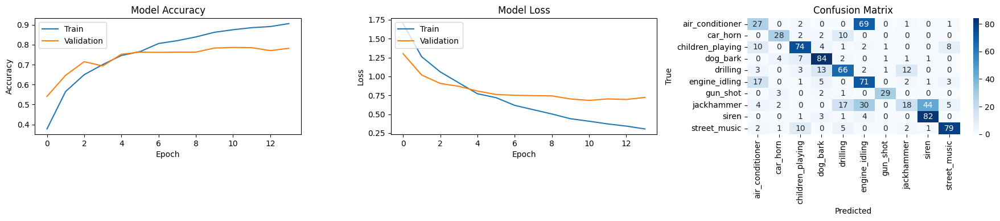

=== Iteration 2 ===
Using Best Parameters:  {'batch_size': 64, 'dense_units': 128, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.0001, 'num_conv_layers': 2}
Shape após Flatten: (None, 88064)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.48724, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.3864237368106842, 'loss': 1.6696747541427612, 'val_accuracy': 0.4808080792427063, 'val_loss': 1.4872417449951172}

Epoch 2: val_loss improved from 1.48724 to 1.32718, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.5805171728134155, 'loss': 1.210782766342163, 'val_accuracy': 0.5636363625526428, 'val_loss': 1.3271807432174683}

Epoch 3: val_loss improved from 1.32718 to 1.25950, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.6608874797821045, 'loss': 0.9922583699226379, 'val_accuracy': 0.5636363625526428, 'val_loss': 1.2594963312149048}

Epoch 4: val_loss improved from 1.25950 to 1.25561, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.7208345532417297, 'loss': 0.8406649827957153, 'val_accuracy': 0.5676767826080322, 'val_loss': 1.2556138038635254}

Epoch 5: val_loss did not improve from 1.25561
E

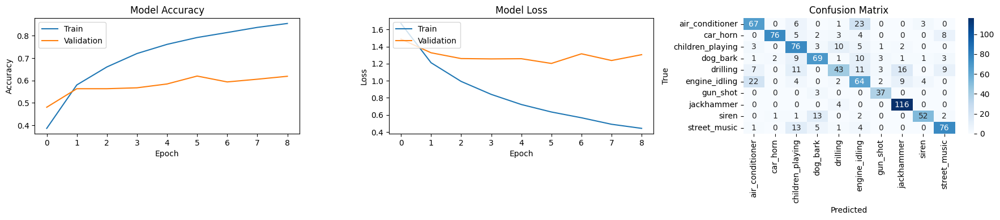

=== Iteration 3 ===
Using Best Parameters:  {'batch_size': 64, 'dense_units': 128, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.0001, 'num_conv_layers': 2}
Shape após Flatten: (None, 88064)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.40775, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.37978583574295044, 'loss': 1.698342204093933, 'val_accuracy': 0.522162139415741, 'val_loss': 1.4077539443969727}

Epoch 2: val_loss improved from 1.40775 to 1.22978, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.5798738598823547, 'loss': 1.2278990745544434, 'val_accuracy': 0.5708107948303223, 'val_loss': 1.2297756671905518}

Epoch 3: val_loss did not improve from 1.22978
Epoch 3/20 - {'accuracy': 0.6689159274101257, 'loss': 0.9904471039772034, 'val_accuracy': 0.5632432699203491, 'val_loss': 1.2787518501281738}

Epoch 4: val_loss did not improve from 1.22978
Epoch 4/20 - {'accuracy': 0.7168842554092407, 'loss': 0.8603459000587463, 'val_accuracy': 0.5772972702980042, 'val_loss': 1.2932955026626587}

Epoch 5: val_loss did not improve from 1.22978
Epoch 5/20 - {'accuracy': 0.7451958060264587, 'loss': 0.7656580805778503, 'val_accuracy': 0.5783783

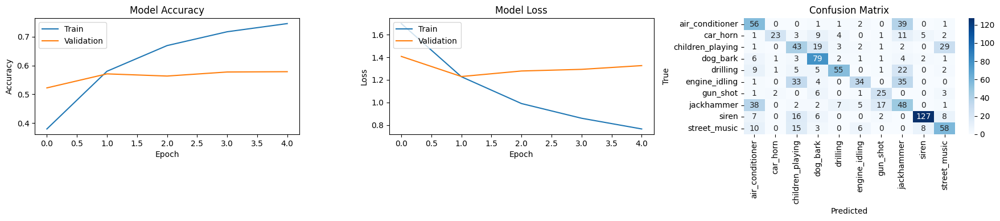

=== Iteration 4 ===
Using Best Parameters:  {'batch_size': 64, 'dense_units': 128, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.0001, 'num_conv_layers': 2}
Shape após Flatten: (None, 88064)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.34268, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.3670904040336609, 'loss': 1.7371896505355835, 'val_accuracy': 0.5843672752380371, 'val_loss': 1.3426810503005981}

Epoch 2: val_loss improved from 1.34268 to 1.30190, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.5620625615119934, 'loss': 1.2716295719146729, 'val_accuracy': 0.555831253528595, 'val_loss': 1.301902174949646}

Epoch 3: val_loss improved from 1.30190 to 1.16485, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.65547776222229, 'loss': 1.0278037786483765, 'val_accuracy': 0.6153846383094788, 'val_loss': 1.1648545265197754}

Epoch 4: val_loss improved from 1.16485 to 1.15222, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.7164690494537354, 'loss': 0.8639912605285645, 'val_accuracy': 0.6265508532524109, 'val_loss': 1.152222990989685}

Epoch 5: val_loss improved from 1.15222 to 1.11870, 

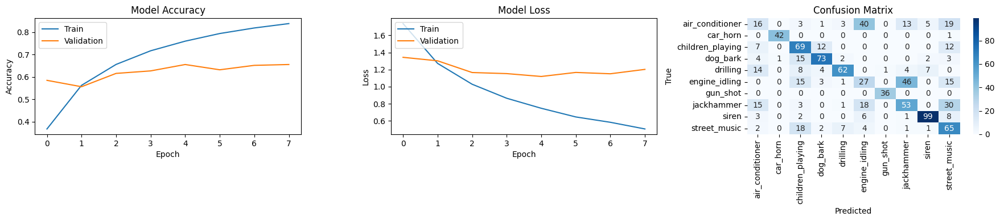

=== Iteration 5 ===
Using Best Parameters:  {'batch_size': 64, 'dense_units': 128, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.0001, 'num_conv_layers': 2}
Shape após Flatten: (None, 88064)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.48929, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.3746304512023926, 'loss': 1.6940902471542358, 'val_accuracy': 0.46780073642730713, 'val_loss': 1.489285945892334}

Epoch 2: val_loss improved from 1.48929 to 1.37787, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.5748275518417358, 'loss': 1.2233870029449463, 'val_accuracy': 0.5103280544281006, 'val_loss': 1.377870798110962}

Epoch 3: val_loss improved from 1.37787 to 1.34959, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.667323648929596, 'loss': 1.0000889301300049, 'val_accuracy': 0.5674362182617188, 'val_loss': 1.3495880365371704}

Epoch 4: val_loss did not improve from 1.34959
Epoch 4/20 - {'accuracy': 0.719273567199707, 'loss': 0.8481925129890442, 'val_accuracy': 0.57351154088974, 'val_loss': 1.3691339492797852}

Epoch 5: val_loss improved from 1.34959 to 1.33576, saving model to model_fold_checkpoint.keras
Epoch

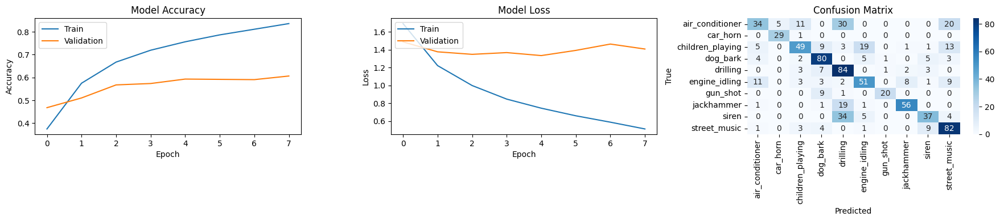

=== Iteration 6 ===
Using Best Parameters:  {'batch_size': 64, 'dense_units': 128, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.0001, 'num_conv_layers': 2}
Shape após Flatten: (None, 88064)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.30656, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.3806139826774597, 'loss': 1.716393232345581, 'val_accuracy': 0.5670102834701538, 'val_loss': 1.3065612316131592}

Epoch 2: val_loss improved from 1.30656 to 1.10920, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.5710631012916565, 'loss': 1.2572944164276123, 'val_accuracy': 0.6380297541618347, 'val_loss': 1.1091978549957275}

Epoch 3: val_loss improved from 1.10920 to 1.06741, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.6571915745735168, 'loss': 1.0175628662109375, 'val_accuracy': 0.6162657737731934, 'val_loss': 1.0674108266830444}

Epoch 4: val_loss improved from 1.06741 to 1.05526, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.7133314609527588, 'loss': 0.8751870393753052, 'val_accuracy': 0.5990836024284363, 'val_loss': 1.0552579164505005}

Epoch 5: val_loss improved from 1.05526 to 1.015

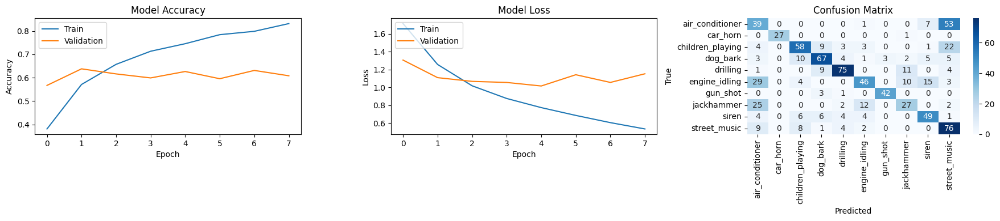

=== Iteration 7 ===
Using Best Parameters:  {'batch_size': 64, 'dense_units': 128, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.0001, 'num_conv_layers': 2}
Shape após Flatten: (None, 88064)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.48303, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.38698190450668335, 'loss': 1.6685385704040527, 'val_accuracy': 0.4868735074996948, 'val_loss': 1.4830280542373657}

Epoch 2: val_loss improved from 1.48303 to 1.27399, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.5863837003707886, 'loss': 1.2035934925079346, 'val_accuracy': 0.5727923512458801, 'val_loss': 1.2739946842193604}

Epoch 3: val_loss improved from 1.27399 to 1.20193, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.6783933639526367, 'loss': 0.9721828699111938, 'val_accuracy': 0.5751789808273315, 'val_loss': 1.2019282579421997}

Epoch 4: val_loss improved from 1.20193 to 1.15370, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.7339410185813904, 'loss': 0.8115985989570618, 'val_accuracy': 0.6038185954093933, 'val_loss': 1.1536953449249268}

Epoch 5: val_loss improved from 1.15370 to 1.1

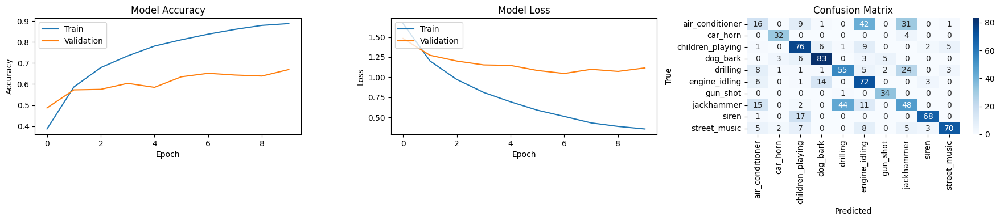

=== Iteration 8 ===
Using Best Parameters:  {'batch_size': 64, 'dense_units': 128, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.0001, 'num_conv_layers': 2}
Shape após Flatten: (None, 88064)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.37330, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.3553263545036316, 'loss': 1.7647430896759033, 'val_accuracy': 0.49632352590560913, 'val_loss': 1.3732997179031372}

Epoch 2: val_loss improved from 1.37330 to 1.19606, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.5295281410217285, 'loss': 1.3275221586227417, 'val_accuracy': 0.5906862616539001, 'val_loss': 1.196062684059143}

Epoch 3: val_loss improved from 1.19606 to 1.12520, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.6171234846115112, 'loss': 1.117277979850769, 'val_accuracy': 0.6213235259056091, 'val_loss': 1.125201940536499}

Epoch 4: val_loss improved from 1.12520 to 1.05259, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.6645945310592651, 'loss': 0.9756762385368347, 'val_accuracy': 0.6495097875595093, 'val_loss': 1.05259370803833}

Epoch 5: val_loss improved from 1.05259 to 1.03373,

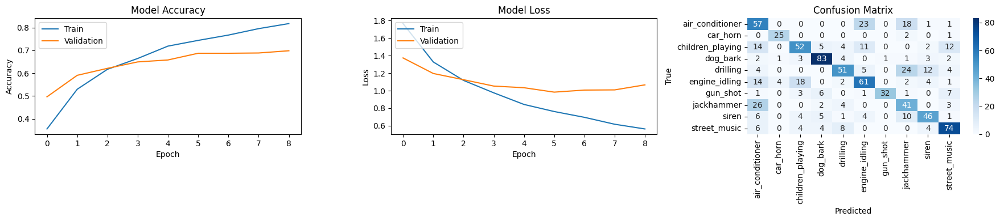

=== Iteration 9 ===
Using Best Parameters:  {'batch_size': 64, 'dense_units': 128, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.0001, 'num_conv_layers': 2}
Shape após Flatten: (None, 88064)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.37984, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.3712388873100281, 'loss': 1.7409623861312866, 'val_accuracy': 0.5483871102333069, 'val_loss': 1.3798418045043945}

Epoch 2: val_loss improved from 1.37984 to 1.25496, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.5575646162033081, 'loss': 1.2799768447875977, 'val_accuracy': 0.5854241251945496, 'val_loss': 1.254961609840393}

Epoch 3: val_loss improved from 1.25496 to 1.14979, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.6394971013069153, 'loss': 1.077629804611206, 'val_accuracy': 0.6081242561340332, 'val_loss': 1.149786353111267}

Epoch 4: val_loss improved from 1.14979 to 1.10978, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.6948721408843994, 'loss': 0.9236178994178772, 'val_accuracy': 0.6535245180130005, 'val_loss': 1.1097842454910278}

Epoch 5: val_loss did not improve from 1.10978
Epo

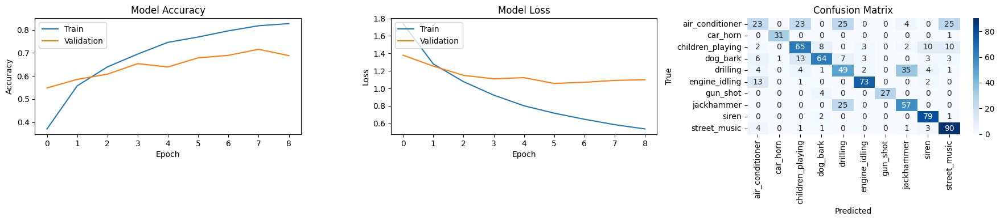

=== Iteration 10 ===
Using Best Parameters:  {'batch_size': 64, 'dense_units': 128, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.0001, 'num_conv_layers': 2}
Shape após Flatten: (None, 88064)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.33592, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.40816327929496765, 'loss': 1.6426981687545776, 'val_accuracy': 0.4909909963607788, 'val_loss': 1.3359246253967285}

Epoch 2: val_loss improved from 1.33592 to 1.24402, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.6043956279754639, 'loss': 1.1618164777755737, 'val_accuracy': 0.559684693813324, 'val_loss': 1.244016170501709}

Epoch 3: val_loss improved from 1.24402 to 1.19829, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.6857428550720215, 'loss': 0.9545705318450928, 'val_accuracy': 0.5382882952690125, 'val_loss': 1.1982927322387695}

Epoch 4: val_loss did not improve from 1.19829
Epoch 4/20 - {'accuracy': 0.7339802980422974, 'loss': 0.8232851028442383, 'val_accuracy': 0.5731981992721558, 'val_loss': 1.2135090827941895}

Epoch 5: val_loss improved from 1.19829 to 1.16754, saving model to model_fold_checkpoint.keras
E

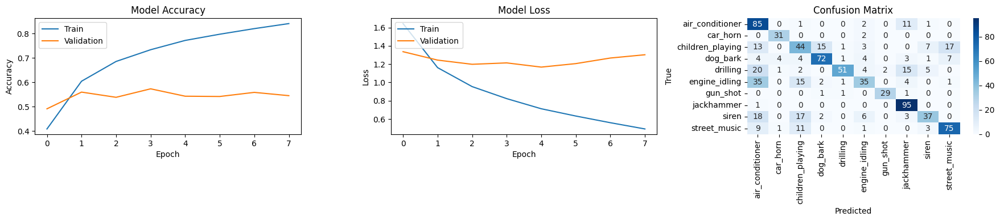

Average of the Accuracy values: 0.6355764687061309
Average of the Loss values: 1.1054254412651061


In [58]:
results_mel = cross_validation_cnn(folds_data_mel, best_params_mel)
accuracy_values_mel, loss_values_mel, cumulative_matrix_mel = results_mel
print("Average of the Accuracy values:", np.mean(accuracy_values_mel))
print("Average of the Loss values:", np.mean(loss_values_mel))

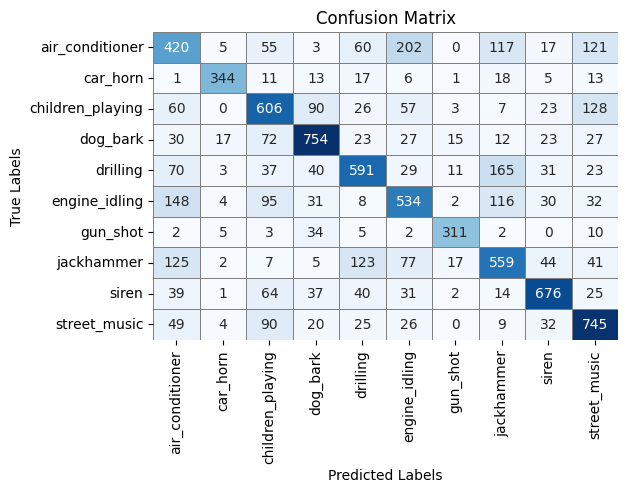

In [59]:
# Plot cumulative confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cumulative_matrix_mel, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 
                         'drilling', 'engine_idling', 'gun_shot', 'jackhammer', 'siren', 'street_music'],
            yticklabels=['air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 
                         'drilling', 'engine_idling', 'gun_shot', 'jackhammer', 'siren', 'street_music'],
            cbar=False, linewidths=0.5, linecolor='gray')
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

=== Iteration 1 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 2}
Shape após Flatten: (None, 27520)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.47540, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.4412275552749634, 'loss': 1.5885099172592163, 'val_accuracy': 0.46474358439445496, 'val_loss': 1.4754018783569336}

Epoch 2: val_loss improved from 1.47540 to 1.19748, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.6689345836639404, 'loss': 0.9798865914344788, 'val_accuracy': 0.6132478713989258, 'val_loss': 1.1974780559539795}

Epoch 3: val_loss improved from 1.19748 to 1.13771, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.7486971616744995, 'loss': 0.7544353604316711, 'val_accuracy': 0.629273533821106, 'val_loss': 1.1377127170562744}

Epoch 4: val_loss improved from 1.13771 to 1.12551, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.8090619444847107, 'loss': 0.5821207761764526, 'val_accuracy': 0.6431623697280884, 'val_loss': 1.125510811805725}

Epoch 5: val_loss improved from 1.12551 to 1.108

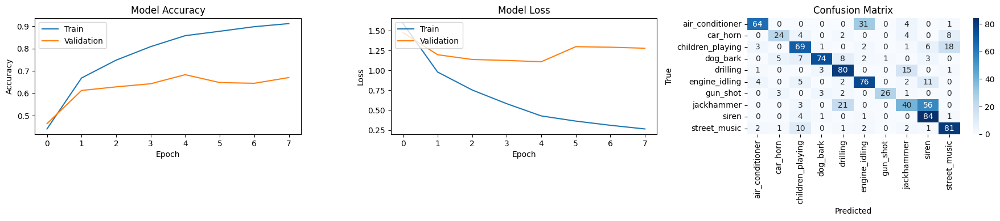

=== Iteration 2 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 2}
Shape após Flatten: (None, 27520)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.66429, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.49456360936164856, 'loss': 1.4284311532974243, 'val_accuracy': 0.42222222685813904, 'val_loss': 1.6642905473709106}

Epoch 2: val_loss improved from 1.66429 to 1.38401, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.7262709140777588, 'loss': 0.813170313835144, 'val_accuracy': 0.5303030014038086, 'val_loss': 1.3840117454528809}

Epoch 3: val_loss did not improve from 1.38401
Epoch 3/20 - {'accuracy': 0.8044372797012329, 'loss': 0.590347945690155, 'val_accuracy': 0.5797979831695557, 'val_loss': 1.440190315246582}

Epoch 4: val_loss did not improve from 1.38401
Epoch 4/20 - {'accuracy': 0.8560094237327576, 'loss': 0.43799129128456116, 'val_accuracy': 0.5989899039268494, 'val_loss': 1.5254851579666138}

Epoch 5: val_loss did not improve from 1.38401
Epoch 5/20 - {'accuracy': 0.8905377388000488, 'loss': 0.3301481604576111, 'val_accuracy': 0.614141

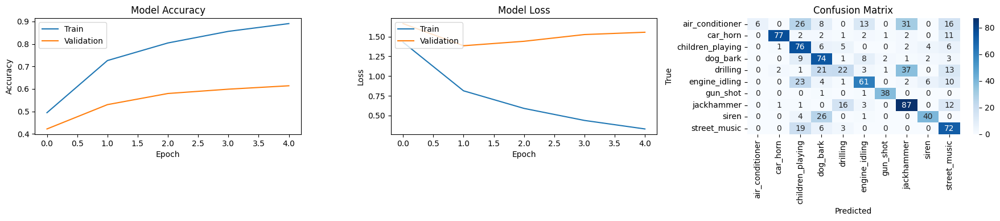

=== Iteration 3 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 2}
Shape após Flatten: (None, 27520)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.44307, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.48100337386131287, 'loss': 1.474269986152649, 'val_accuracy': 0.5178378224372864, 'val_loss': 1.443069338798523}

Epoch 2: val_loss improved from 1.44307 to 1.42508, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.6984010338783264, 'loss': 0.9142332673072815, 'val_accuracy': 0.5254054069519043, 'val_loss': 1.4250818490982056}

Epoch 3: val_loss did not improve from 1.42508
Epoch 3/20 - {'accuracy': 0.7600117325782776, 'loss': 0.724218487739563, 'val_accuracy': 0.5243242979049683, 'val_loss': 1.4895066022872925}

Epoch 4: val_loss did not improve from 1.42508
Epoch 4/20 - {'accuracy': 0.8142877817153931, 'loss': 0.5415763854980469, 'val_accuracy': 0.5502702593803406, 'val_loss': 1.6860051155090332}

Epoch 5: val_loss did not improve from 1.42508
Epoch 5/20 - {'accuracy': 0.8514009118080139, 'loss': 0.43630820512771606, 'val_accuracy': 0.5567567

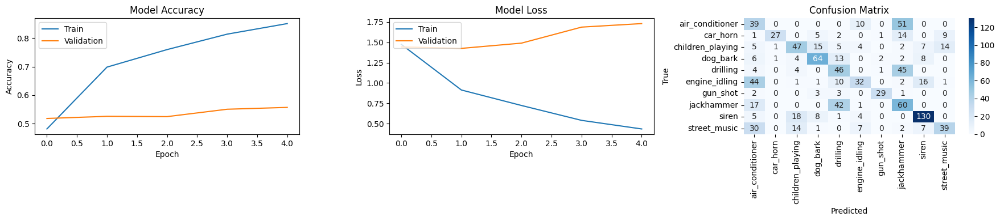

=== Iteration 4 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 2}
Shape após Flatten: (None, 27520)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.41752, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.45693472027778625, 'loss': 1.520499587059021, 'val_accuracy': 0.46277916431427, 'val_loss': 1.4175204038619995}

Epoch 2: val_loss improved from 1.41752 to 1.29714, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.6853306889533997, 'loss': 0.9291847944259644, 'val_accuracy': 0.5967742204666138, 'val_loss': 1.2971445322036743}

Epoch 3: val_loss did not improve from 1.29714
Epoch 3/20 - {'accuracy': 0.7617483139038086, 'loss': 0.6976783871650696, 'val_accuracy': 0.5607940554618835, 'val_loss': 1.4854564666748047}

Epoch 4: val_loss did not improve from 1.29714
Epoch 4/20 - {'accuracy': 0.8250250220298767, 'loss': 0.5215668678283691, 'val_accuracy': 0.5310173630714417, 'val_loss': 1.5372165441513062}

Epoch 5: val_loss did not improve from 1.29714
Epoch 5/20 - {'accuracy': 0.8637337684631348, 'loss': 0.420341819524765, 'val_accuracy': 0.533498764

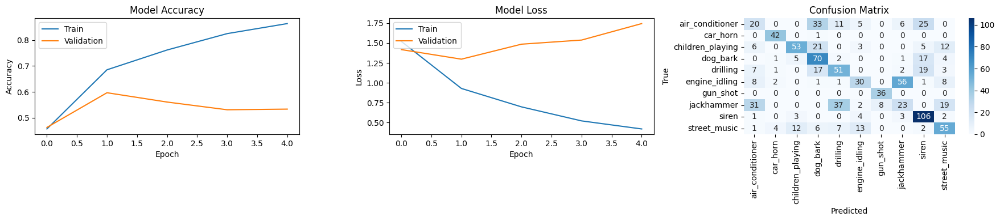

=== Iteration 5 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 2}
Shape após Flatten: (None, 27520)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.46028, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.462339848279953, 'loss': 1.508500576019287, 'val_accuracy': 0.4981774091720581, 'val_loss': 1.460278034210205}

Epoch 2: val_loss improved from 1.46028 to 1.27109, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.711530327796936, 'loss': 0.8652819991111755, 'val_accuracy': 0.5747265815734863, 'val_loss': 1.2710864543914795}

Epoch 3: val_loss did not improve from 1.27109
Epoch 3/20 - {'accuracy': 0.8051527738571167, 'loss': 0.596470296382904, 'val_accuracy': 0.5710813999176025, 'val_loss': 1.4297457933425903}

Epoch 4: val_loss did not improve from 1.27109
Epoch 4/20 - {'accuracy': 0.859777569770813, 'loss': 0.4347190856933594, 'val_accuracy': 0.5820170044898987, 'val_loss': 1.5263561010360718}

Epoch 5: val_loss did not improve from 1.27109
Epoch 5/20 - {'accuracy': 0.8893425464630127, 'loss': 0.3406030237674713, 'val_accuracy': 0.590522468090

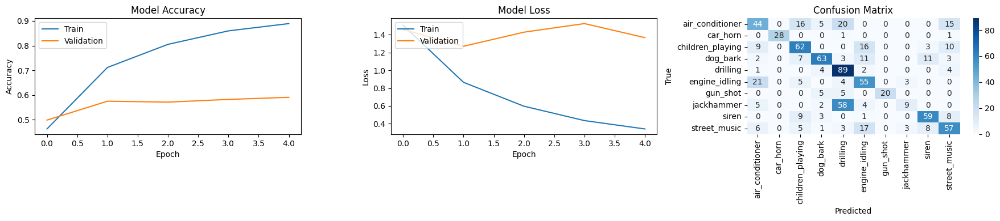

=== Iteration 6 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 2}
Shape após Flatten: (None, 27520)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.51696, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.4290790259838104, 'loss': 1.5919160842895508, 'val_accuracy': 0.5211912989616394, 'val_loss': 1.516964316368103}

Epoch 2: val_loss improved from 1.51696 to 1.37799, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.6910176277160645, 'loss': 0.930989682674408, 'val_accuracy': 0.5704467296600342, 'val_loss': 1.3779910802841187}

Epoch 3: val_loss did not improve from 1.37799
Epoch 3/20 - {'accuracy': 0.7669129967689514, 'loss': 0.7016727328300476, 'val_accuracy': 0.5463917255401611, 'val_loss': 1.4991555213928223}

Epoch 4: val_loss improved from 1.37799 to 1.30764, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.82760089635849, 'loss': 0.5302320122718811, 'val_accuracy': 0.5807560086250305, 'val_loss': 1.307642936706543}

Epoch 5: val_loss did not improve from 1.30764
Epoch 5/20 - {'accuracy': 0.862563967704773, 'loss': 0

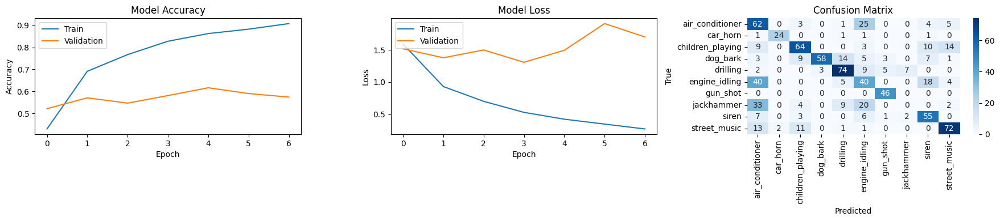

=== Iteration 7 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 2}
Shape após Flatten: (None, 27520)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.15375, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.527845025062561, 'loss': 1.37277352809906, 'val_accuracy': 0.5859188437461853, 'val_loss': 1.1537452936172485}

Epoch 2: val_loss improved from 1.15375 to 1.02287, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.7362198829650879, 'loss': 0.793889045715332, 'val_accuracy': 0.6300715804100037, 'val_loss': 1.0228652954101562}

Epoch 3: val_loss improved from 1.02287 to 0.94886, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.8174049258232117, 'loss': 0.546240508556366, 'val_accuracy': 0.7004773020744324, 'val_loss': 0.9488609433174133}

Epoch 4: val_loss did not improve from 0.94886
Epoch 4/20 - {'accuracy': 0.872240424156189, 'loss': 0.37508779764175415, 'val_accuracy': 0.656324565410614, 'val_loss': 1.012636423110962}

Epoch 5: val_loss did not improve from 0.94886
Epoch 5/20 - {'accuracy': 0.8995869755744934, 'loss': 0.

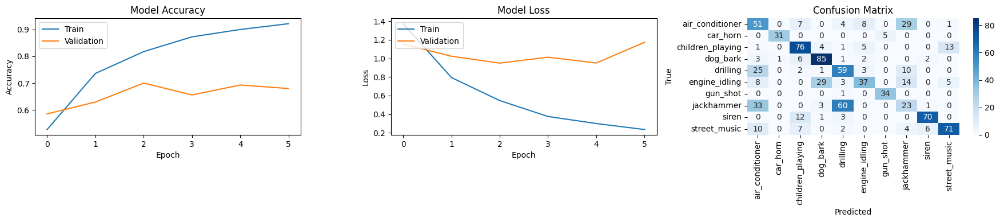

=== Iteration 8 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 2}
Shape após Flatten: (None, 27520)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.20408, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.4328906536102295, 'loss': 1.5870839357376099, 'val_accuracy': 0.5833333134651184, 'val_loss': 1.2040777206420898}

Epoch 2: val_loss improved from 1.20408 to 1.06699, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.677733838558197, 'loss': 0.9467469453811646, 'val_accuracy': 0.6715686321258545, 'val_loss': 1.0669920444488525}

Epoch 3: val_loss improved from 1.06699 to 1.00294, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.7723933458328247, 'loss': 0.683073103427887, 'val_accuracy': 0.688725471496582, 'val_loss': 1.002939224243164}

Epoch 4: val_loss did not improve from 1.00294
Epoch 4/20 - {'accuracy': 0.823255181312561, 'loss': 0.5338085293769836, 'val_accuracy': 0.7058823704719543, 'val_loss': 1.259705662727356}

Epoch 5: val_loss did not improve from 1.00294
Epoch 5/20 - {'accuracy': 0.8601299524307251, 'loss': 0

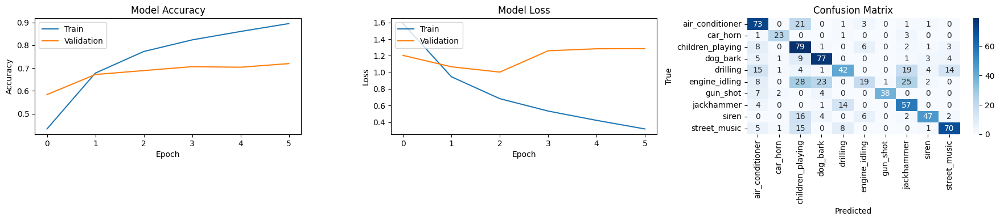

=== Iteration 9 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 2}
Shape após Flatten: (None, 27520)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.18603, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.4586805999279022, 'loss': 1.5469805002212524, 'val_accuracy': 0.636798083782196, 'val_loss': 1.1860263347625732}

Epoch 2: val_loss improved from 1.18603 to 1.17844, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.7008051872253418, 'loss': 0.8760339617729187, 'val_accuracy': 0.6284348964691162, 'val_loss': 1.178444743156433}

Epoch 3: val_loss improved from 1.17844 to 1.15801, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.7797711491584778, 'loss': 0.6574039459228516, 'val_accuracy': 0.6714456677436829, 'val_loss': 1.1580063104629517}

Epoch 4: val_loss improved from 1.15801 to 1.14295, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.8296369314193726, 'loss': 0.5239625573158264, 'val_accuracy': 0.6630824208259583, 'val_loss': 1.1429508924484253}

Epoch 5: val_loss did not improve from 1.14295
Ep

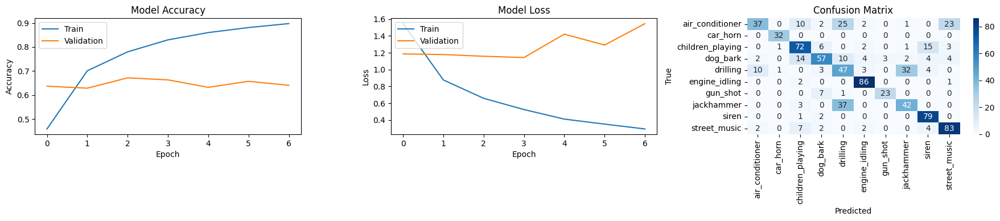

=== Iteration 10 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 2}
Shape após Flatten: (None, 27520)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.28132, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.44212931394577026, 'loss': 1.577101469039917, 'val_accuracy': 0.49887385964393616, 'val_loss': 1.2813243865966797}

Epoch 2: val_loss improved from 1.28132 to 1.27203, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.6684743762016296, 'loss': 0.9633695483207703, 'val_accuracy': 0.537162184715271, 'val_loss': 1.272027611732483}

Epoch 3: val_loss did not improve from 1.27203
Epoch 3/20 - {'accuracy': 0.7516769170761108, 'loss': 0.7448779344558716, 'val_accuracy': 0.5360360145568848, 'val_loss': 1.2843691110610962}

Epoch 4: val_loss did not improve from 1.27203
Epoch 4/20 - {'accuracy': 0.8070501089096069, 'loss': 0.5707804560661316, 'val_accuracy': 0.5585585832595825, 'val_loss': 1.3352299928665161}

Epoch 5: val_loss did not improve from 1.27203
Epoch 5/20 - {'accuracy': 0.852718710899353, 'loss': 0.43993857502937317, 'val_accuracy': 0.6137387

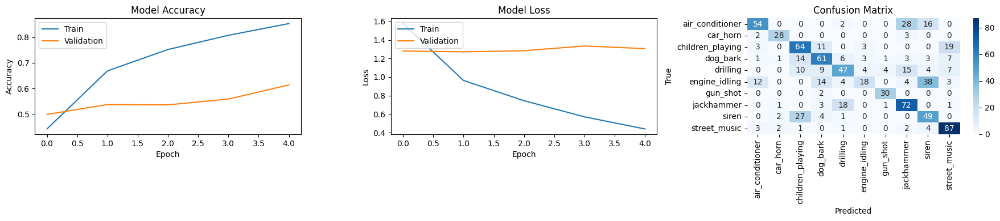

Average of the Accuracy values: 0.6069535315036774
Average of the Loss values: 1.2610254645347596


In [32]:
results_mfcc = cross_validation_cnn(folds_data_mfcc, best_params_mfcc)
accuracy_values_mfcc, loss_values_mfcc, cumulative_matrix_mfcc = results_mfcc
print("Average of the Accuracy values:", np.mean(accuracy_values_mfcc))
print("Average of the Loss values:", np.mean(loss_values_mfcc))

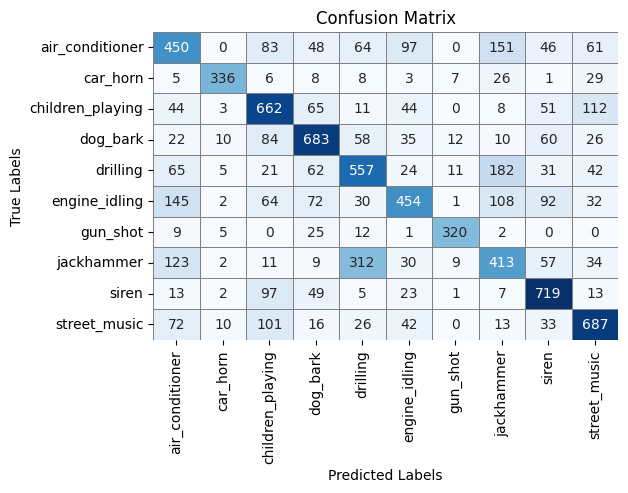

In [52]:
# Plot cumulative confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cumulative_matrix_mfcc, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 
                         'drilling', 'engine_idling', 'gun_shot', 'jackhammer', 'siren', 'street_music'],
            yticklabels=['air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 
                         'drilling', 'engine_idling', 'gun_shot', 'jackhammer', 'siren', 'street_music'],
            cbar=False, linewidths=0.5, linecolor='gray')
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

=== Iteration 1 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 3}
Shape após Flatten: (None, 5632)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.69387, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.28097859025001526, 'loss': 1.8460062742233276, 'val_accuracy': 0.37072649598121643, 'val_loss': 1.693865180015564}

Epoch 2: val_loss improved from 1.69387 to 1.36757, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.44701793789863586, 'loss': 1.4829456806182861, 'val_accuracy': 0.49252137541770935, 'val_loss': 1.367569923400879}

Epoch 3: val_loss improved from 1.36757 to 1.24271, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.5534163117408752, 'loss': 1.2363219261169434, 'val_accuracy': 0.5715811848640442, 'val_loss': 1.2427144050598145}

Epoch 4: val_loss did not improve from 1.24271
Epoch 4/20 - {'accuracy': 0.6205848455429077, 'loss': 1.0680198669433594, 'val_accuracy': 0.4989316165447235, 'val_loss': 1.3769235610961914}

Epoch 5: val_loss did not improve from 1.24271
Epoch 5/20 - {'accuracy': 0.6813839077949524, '

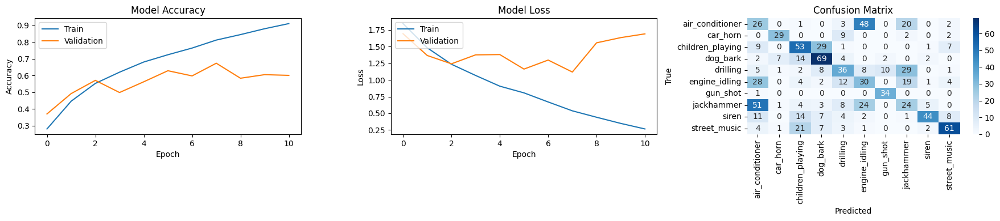

=== Iteration 2 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 3}
Shape após Flatten: (None, 5632)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.73705, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.2732882797718048, 'loss': 1.867493987083435, 'val_accuracy': 0.30202019214630127, 'val_loss': 1.737054467201233}

Epoch 2: val_loss improved from 1.73705 to 1.68819, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.4272700548171997, 'loss': 1.518363118171692, 'val_accuracy': 0.37272727489471436, 'val_loss': 1.6881861686706543}

Epoch 3: val_loss improved from 1.68819 to 1.67738, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.5376138687133789, 'loss': 1.2677695751190186, 'val_accuracy': 0.38181817531585693, 'val_loss': 1.6773847341537476}

Epoch 4: val_loss improved from 1.67738 to 1.56793, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.6106376647949219, 'loss': 1.0718398094177246, 'val_accuracy': 0.4252525269985199, 'val_loss': 1.5679266452789307}

Epoch 5: val_loss did not improve from 1.56793


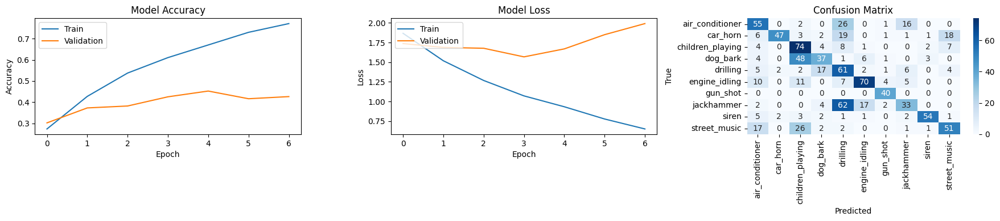

=== Iteration 3 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 3}
Shape após Flatten: (None, 5632)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.74635, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.2844359576702118, 'loss': 1.8631017208099365, 'val_accuracy': 0.318918913602829, 'val_loss': 1.746352195739746}

Epoch 2: val_loss improved from 1.74635 to 1.48040, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.45650580525398254, 'loss': 1.478966474533081, 'val_accuracy': 0.45081081986427307, 'val_loss': 1.4803990125656128}

Epoch 3: val_loss improved from 1.48040 to 1.38161, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.5593369603157043, 'loss': 1.229465365409851, 'val_accuracy': 0.4843243360519409, 'val_loss': 1.381606101989746}

Epoch 4: val_loss improved from 1.38161 to 1.24723, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.6281355619430542, 'loss': 1.0446184873580933, 'val_accuracy': 0.561081051826477, 'val_loss': 1.2472347021102905}

Epoch 5: val_loss did not improve from 1.24723
Epoc

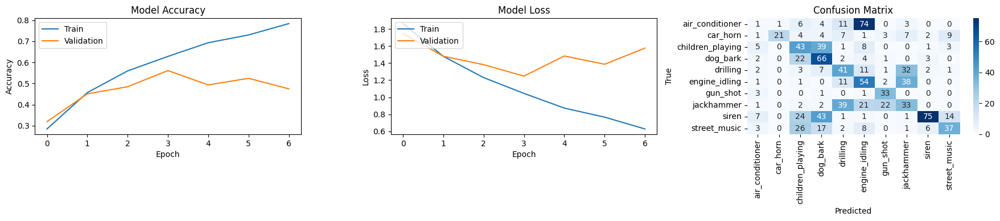

=== Iteration 4 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 3}
Shape após Flatten: (None, 5632)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.77541, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.2968147397041321, 'loss': 1.8454046249389648, 'val_accuracy': 0.33870968222618103, 'val_loss': 1.7754086256027222}

Epoch 2: val_loss improved from 1.77541 to 1.66608, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.4785030782222748, 'loss': 1.4337010383605957, 'val_accuracy': 0.41439205408096313, 'val_loss': 1.6660826206207275}

Epoch 3: val_loss did not improve from 1.66608
Epoch 3/20 - {'accuracy': 0.5743465423583984, 'loss': 1.1829419136047363, 'val_accuracy': 0.41811415553092957, 'val_loss': 1.8990098237991333}

Epoch 4: val_loss did not improve from 1.66608
Epoch 4/20 - {'accuracy': 0.6494786739349365, 'loss': 1.0033446550369263, 'val_accuracy': 0.4019851088523865, 'val_loss': 1.9458938837051392}

Epoch 5: val_loss did not improve from 1.66608
Epoch 5/20 - {'accuracy': 0.7010427117347717, 'loss': 0.8670175075531006, 'val_accuracy': 0.399

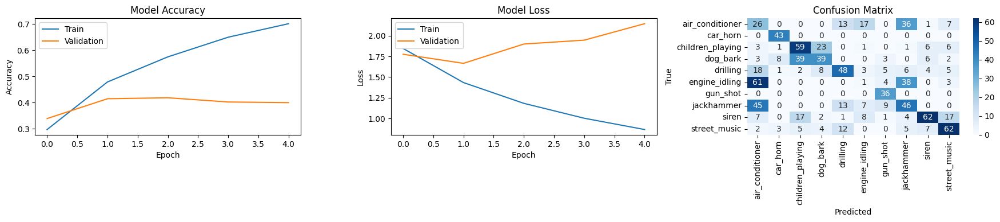

=== Iteration 5 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 3}
Shape após Flatten: (None, 5632)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.82376, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.27762916684150696, 'loss': 1.8656718730926514, 'val_accuracy': 0.32563790678977966, 'val_loss': 1.823756217956543}

Epoch 2: val_loss improved from 1.82376 to 1.79100, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.45938336849212646, 'loss': 1.455504298210144, 'val_accuracy': 0.39246657490730286, 'val_loss': 1.7909975051879883}

Epoch 3: val_loss improved from 1.79100 to 1.65217, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.5718710422515869, 'loss': 1.1891233921051025, 'val_accuracy': 0.47873634099960327, 'val_loss': 1.652173638343811}

Epoch 4: val_loss did not improve from 1.65217
Epoch 4/20 - {'accuracy': 0.6366323828697205, 'loss': 1.0230212211608887, 'val_accuracy': 0.5103280544281006, 'val_loss': 1.6761972904205322}

Epoch 5: val_loss did not improve from 1.65217
Epoch 5/20 - {'accuracy': 0.7127974033355713, '

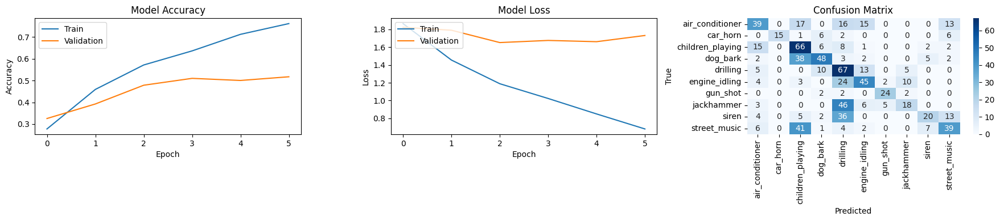

=== Iteration 6 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 3}
Shape após Flatten: (None, 5632)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.57039, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.2910744845867157, 'loss': 1.8388690948486328, 'val_accuracy': 0.43986254930496216, 'val_loss': 1.5703871250152588}

Epoch 2: val_loss improved from 1.57039 to 1.40547, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.4910460412502289, 'loss': 1.3880659341812134, 'val_accuracy': 0.49484536051750183, 'val_loss': 1.4054659605026245}

Epoch 3: val_loss did not improve from 1.40547
Epoch 3/20 - {'accuracy': 0.611853301525116, 'loss': 1.12419855594635, 'val_accuracy': 0.5028637051582336, 'val_loss': 1.4334043264389038}

Epoch 4: val_loss improved from 1.40547 to 1.37862, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.6709778308868408, 'loss': 0.9231727123260498, 'val_accuracy': 0.544100821018219, 'val_loss': 1.3786232471466064}

Epoch 5: val_loss did not improve from 1.37862
Epoch 5/20 - {'accuracy': 0.7302444577217102, 'loss

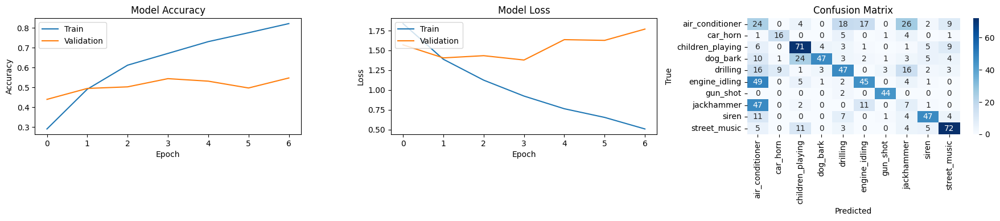

=== Iteration 7 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 3}
Shape após Flatten: (None, 5632)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.71382, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.29354792833328247, 'loss': 1.8345434665679932, 'val_accuracy': 0.2959427237510681, 'val_loss': 1.7138155698776245}

Epoch 2: val_loss improved from 1.71382 to 1.70410, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.4948013126850128, 'loss': 1.3747823238372803, 'val_accuracy': 0.4152744710445404, 'val_loss': 1.7041027545928955}

Epoch 3: val_loss improved from 1.70410 to 1.61620, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.5952143669128418, 'loss': 1.133844017982483, 'val_accuracy': 0.4510739743709564, 'val_loss': 1.6162010431289673}

Epoch 4: val_loss improved from 1.61620 to 1.50363, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.6523287296295166, 'loss': 0.9811748266220093, 'val_accuracy': 0.5023866295814514, 'val_loss': 1.5036338567733765}

Epoch 5: val_loss did not improve from 1.50363


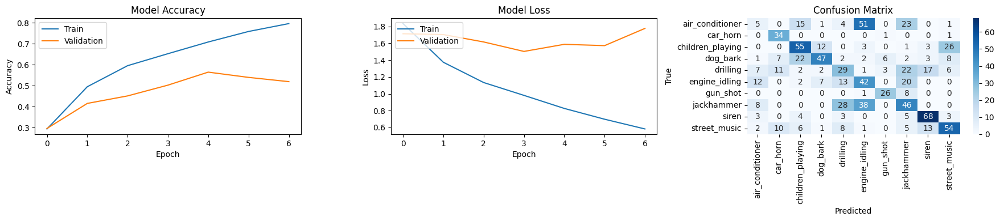

=== Iteration 8 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 3}
Shape após Flatten: (None, 5632)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.80507, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.31096354126930237, 'loss': 1.7953412532806396, 'val_accuracy': 0.37745097279548645, 'val_loss': 1.8050748109817505}

Epoch 2: val_loss improved from 1.80507 to 1.69237, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.480361670255661, 'loss': 1.3994282484054565, 'val_accuracy': 0.531862735748291, 'val_loss': 1.6923748254776}

Epoch 3: val_loss did not improve from 1.69237
Epoch 3/20 - {'accuracy': 0.5788358449935913, 'loss': 1.170262336730957, 'val_accuracy': 0.5588235259056091, 'val_loss': 1.726266622543335}

Epoch 4: val_loss improved from 1.69237 to 1.57830, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.664311945438385, 'loss': 0.9669345617294312, 'val_accuracy': 0.591911792755127, 'val_loss': 1.5783029794692993}

Epoch 5: val_loss did not improve from 1.57830
Epoch 5/20 - {'accuracy': 0.7130545377731323, 'loss': 0.

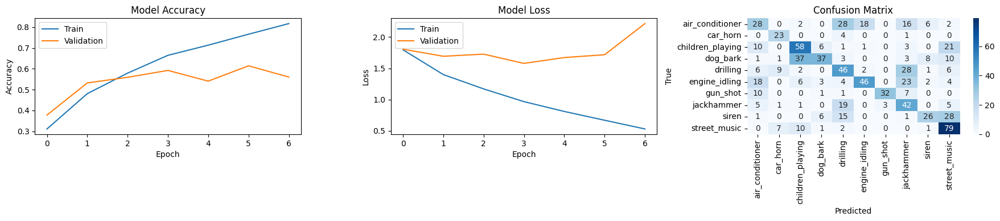

=== Iteration 9 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 3}
Shape após Flatten: (None, 5632)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.69771, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.2926967144012451, 'loss': 1.8437329530715942, 'val_accuracy': 0.3201911449432373, 'val_loss': 1.6977101564407349}

Epoch 2: val_loss improved from 1.69771 to 1.40364, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.44088149070739746, 'loss': 1.4775490760803223, 'val_accuracy': 0.438470721244812, 'val_loss': 1.4036448001861572}

Epoch 3: val_loss did not improve from 1.40364
Epoch 3/20 - {'accuracy': 0.5500776767730713, 'loss': 1.244519829750061, 'val_accuracy': 0.4301075339317322, 'val_loss': 1.461112380027771}

Epoch 4: val_loss improved from 1.40364 to 1.35930, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.6314451098442078, 'loss': 1.0448358058929443, 'val_accuracy': 0.5101553201675415, 'val_loss': 1.359296441078186}

Epoch 5: val_loss improved from 1.35930 to 1.22276, saving model to model_fold_checkpoint.keras
Epo

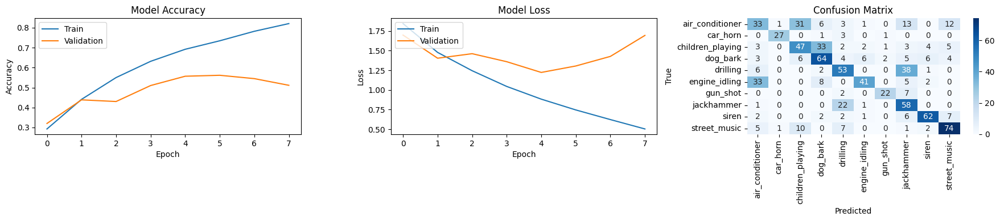

=== Iteration 10 ===
Using Best Parameters:  {'batch_size': 32, 'dense_units': 256, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.001, 'num_conv_layers': 3}
Shape após Flatten: (None, 5632)


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from inf to 1.72889, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.2989867329597473, 'loss': 1.8212031126022339, 'val_accuracy': 0.3569819927215576, 'val_loss': 1.7288897037506104}

Epoch 2: val_loss improved from 1.72889 to 1.69207, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.47095760703086853, 'loss': 1.4240143299102783, 'val_accuracy': 0.3468468487262726, 'val_loss': 1.6920688152313232}

Epoch 3: val_loss improved from 1.69207 to 1.56320, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.5558726787567139, 'loss': 1.227746844291687, 'val_accuracy': 0.41328829526901245, 'val_loss': 1.5631990432739258}

Epoch 4: val_loss did not improve from 1.56320
Epoch 4/20 - {'accuracy': 0.630084216594696, 'loss': 1.0519347190856934, 'val_accuracy': 0.43130630254745483, 'val_loss': 1.5674545764923096}

Epoch 5: val_loss did not improve from 1.56320
Epoch 5/20 - {'accuracy': 0.6816040873527527, 'l

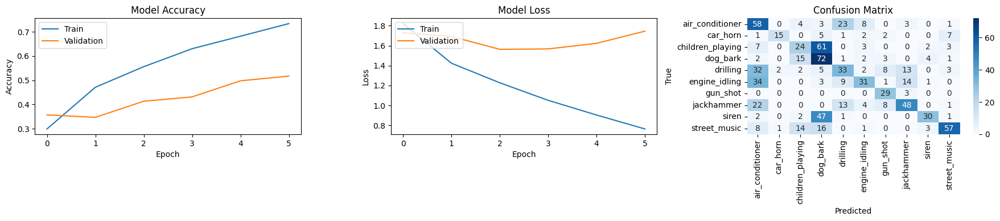

Average of the Accuracy values: 0.4888679474592209
Average of the Loss values: 1.6207197308540344


In [50]:
results_chroma = cross_validation_cnn(folds_data_chroma, best_params_chroma)
accuracy_values_chroma, loss_values_chroma, cumulative_matrix_chroma = results_chroma
print("Average of the Accuracy values:", np.mean(accuracy_values_chroma))
print("Average of the Loss values:", np.mean(loss_values_chroma))

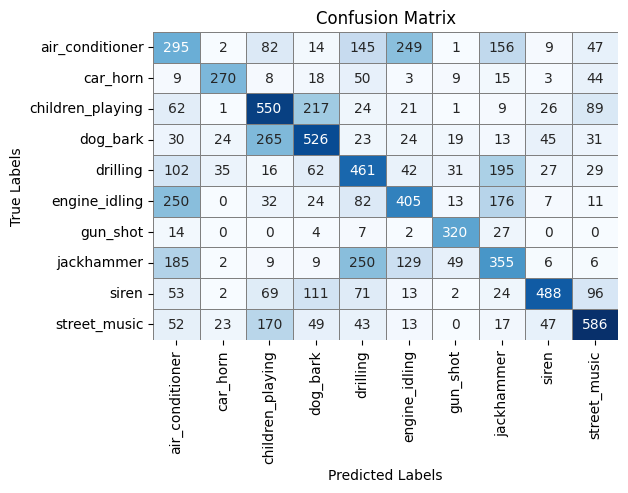

In [53]:
# Plot cumulative confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cumulative_matrix_chroma, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 
                         'drilling', 'engine_idling', 'gun_shot', 'jackhammer', 'siren', 'street_music'],
            yticklabels=['air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 
                         'drilling', 'engine_idling', 'gun_shot', 'jackhammer', 'siren', 'street_music'],
            cbar=False, linewidths=0.5, linecolor='gray')
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

**Comparison of CNN Models**

**ANOVA test**

The ANOVA (Analysis of Variance) test is a statistical method used to determine whether there are significant differences between the means of three or more groups. It works by comparing the variance within each group to the variance between the groups. If the between-group variance is significantly larger than the within-group variance, it suggests that at least one of the groups differs significantly from the others.

To compare the results of our 3 CNN models, the ANOVA was used to test whether the average accuracies of the each model differ significantly. Each CNN represents a different group, and the performance metrics calculated across multiple cross-validation folds served as the data for each group. If the ANOVA test shows a significant difference, it indicates that at least one of the CNN models performs better than the others. 

By applying the ANOVA test, it is possible to determine, if it exists, the model with the best performance. This model will then be used to perform the following performance improvement techniques.

- ANOVA test performed on the Accuracy Metric

In [62]:
from pingouin import welch_anova
data = {
    'accuracy': np.concatenate([accuracy_values_mel, accuracy_values_mfcc, accuracy_values_chroma]),
    'model': ['CNN_MEL'] * 10 + ['CNN_MFCC'] * 10 + ['CNN_CHROMA'] * 10
}
df = pd.DataFrame(data)
result = welch_anova(dv='accuracy', between='model', data=df)
print(result)

  Source  ddof1     ddof2          F     p-unc      np2
0  model      2  17.90637  22.012301  0.000015  0.61834


In [63]:
from pingouin import pairwise_gameshowell

# Executa o teste post-hoc de Games-Howell
post_hoc_result = pairwise_gameshowell(dv='accuracy', between='model', data=df)

# Exibe os resultados
print(post_hoc_result)


            A         B   mean(A)   mean(B)      diff        se         T  \
0  CNN_CHROMA   CNN_MEL  0.488868  0.635576 -0.146709  0.022494 -6.522095   
1  CNN_CHROMA  CNN_MFCC  0.488868  0.606954 -0.118086  0.024528 -4.814260   
2     CNN_MEL  CNN_MFCC  0.635576  0.606954  0.028623  0.023483  1.218878   

          df      pval    hedges  
0  17.824652  0.000012 -2.793526  
1  17.897777  0.000395 -2.062031  
2  17.474242  0.458135  0.522067  


Since the p-value > 0.05, there is statistically significant difference between the accuracy means of the models. However, a medium effect size (np2 = 0.082521) suggests that there is some variability that can be explained by the models. Doing a Games_Howell post-hoc test, we can see that the model that uses spectrograms has a statistically significant higher accuracy than the chroma model and mcff model.

### **DeepFool** 
[Back to Table of Contents](#Table-of-Contents) 

The deepfool algorithm is considered by many to be a simple and accurate method to fool deep neural networks, by computing the minimal perturbations necessary to cause a classifier to misclassify an input.

The DeepFool algorithm computes the perturbation of r*(x) by having the output prediction of 𝑓(x_0) divided by the L2-norm of the computed gradient ω of the loss function, giving the scalar for the perturbation. This is then multiplied by the unit vector of ω using L2-norm and finally has the sign inverted so the loss of the classifier 𝑓 is increased.



<div style="display: flex; justify-content: center; align-items: center;">
    <img src="deepfool.png" alt="Softmax Activation Function" width="300">
</div>

<div style="text-align: center; color: lightblue; font-weight: bold;">
utils.deepfool_mlp(model, x0, y0, max_iter=50, epsilon=1e-6)

utils.deepfool_cnn(model, x0, y0, max_iter=50, epsilon=1e-6)
</div>


**DeepFool on MLP**

[Back to DeepFool](#DeepFool)

In [68]:

def deepfool_mlp(model, x0, y0, max_iter=50, epsilon=1e-6):
    """    
    Args:
        model: A TensorFlow/Keras model.
        x0: The input image (numpy array of shape [H, W, C] or [1, H, W, C]).
        y0: The true label (integer).
        max_iter: Maximum number of iterations for the attack.
        epsilon: A small value to avoid division by zero.
    
    Returns:
        x_adv: The adversarial example.
    """
    x = tf.convert_to_tensor(x0, dtype=tf.float32)
    x_adv = tf.identity(x)  # Initialize adversarial example as the original input
    logits = model(x_adv)  # Get initial logits
    pred_label = tf.argmax(logits, axis=-1).numpy()[0]
    
    if pred_label != y0:
        return x0  # If already misclassified, return the original input

    # Iterative DeepFool
    for i in range(max_iter):
        with tf.GradientTape() as tape:
            tape.watch(x_adv)
            logits = model(x_adv)  # Shape: (1, num_classes)
        
        gradients = tape.gradient(logits, x_adv)  # Shape: (1, H, W, C)
        logits = logits.numpy()[0]  # Convert logits to 1D array (num_classes)
        gradients = gradients.numpy()  # Convert gradients to numpy array

        current_label = np.argmax(logits)
        if current_label != y0:
            break  # Stop if misclassified

        # Compute perturbation for each class
        w = gradients[0] - gradients[0][y0]  # Fix shape mismatch
        f = logits - logits[y0]

        perturbations = []
        for k in range(len(logits)):  # Iterate over all classes
            if k != y0:
                # Avoid division by zero in norm calculation
                norm_w_k = np.linalg.norm(w[k].flatten()) + epsilon
                perturbations.append((abs(f[k]) / norm_w_k, k))
        
        # Find the closest class decision boundary
        perturbations.sort()
        r_min, k_min = perturbations[0]

        # Apply the perturbation
        x_adv = x_adv + (1 + epsilon) * tf.convert_to_tensor(r_min * w[k_min], dtype=tf.float32)

    return x_adv.numpy()




def cross_validation_mlp_deepfool(datasets, model, params):
    accuracy_values = []
    loss_values = []
    robustness_values = []

    for i in range(len(datasets)):
        print(f"=== Fold {i+1} ===")

        # Split the datasets
        test_set = datasets[i]
        validation_set = datasets[(i + 1) % len(datasets)]
        train_set = pd.concat(datasets[:i] + datasets[(i + 1) % len(datasets):])

        X_train, y_train = train_set.iloc[:, :-1].values, train_set.iloc[:, -1].values
        X_val, y_val = validation_set.iloc[:, :-1].values, validation_set.iloc[:, -1].values
        X_test, y_test = test_set.iloc[:, :-1].values, test_set.iloc[:, -1].values

        # Convert data to tensors
        X_train = tf.convert_to_tensor(X_train, dtype=tf.float32)
        X_val = tf.convert_to_tensor(X_val, dtype=tf.float32)
        X_test = tf.convert_to_tensor(X_test, dtype=tf.float32)

        y_train = tf.convert_to_tensor(y_train, dtype=tf.int32)
        y_val = tf.convert_to_tensor(y_val, dtype=tf.int32)
        y_test = tf.convert_to_tensor(y_test, dtype=tf.int32)

        # Initialize and train the model
        model_instance = model.copy()
        model_instance.build_model(
            hidden_layers=params['hidden_layers'],
            learning_rate=params['learning_rate'],
            dropout_rate=params['dropout_rate'],
            optimizer=params['optimizer'],
            l2_lambda=params['l2_lambda']
        )
        model_instance.train(
            X_train, y_train, X_val, y_val,
            epochs=params['epochs'],
            batch_size=params['batch_size']
        )

        # Evaluate the model on the test set
        fold_loss, fold_accuracy = model_instance.evaluate(X_test, y_test)
        accuracy_values.append(fold_accuracy)
        loss_values.append(fold_loss)

        # Apply DeepFool to evaluate robustness
        adversarial_examples = []
        for j in range(len(X_test)):
            x0 = tf.expand_dims(X_test[j], axis=0)  # Single test example
            y0 = y_test[j]  # True label for this example

            try:
                # Generate adversarial example
                x_adv = deepfool_mlp(model_instance.model, x0, y0)
                adversarial_examples.append(x_adv)

                # Evaluate adversarial example
                adv_pred = tf.argmax(model_instance.model(x_adv), axis=-1)
                if adv_pred != tf.cast(y0, dtype=tf.int64):
                    print(f"Example {j}: Successfully fooled. True: {y0}, Adversarial: {adv_pred}")
                else:
                    print(f"Example {j}: Failed to fool. True: {y0}, Adversarial: {adv_pred}")

            except ValueError as e:
                print(f"DeepFool error on example {j}: {e}")
                continue

        # Calculate robustness
        adv_correct = 0
        for adv_x, true_y in zip(adversarial_examples, y_test):
            adv_pred = tf.argmax(model_instance.model(adv_x), axis=-1)
            if adv_pred == tf.cast(true_y, dtype=tf.int64):
                adv_correct += 1

        robustness_accuracy = adv_correct / len(y_test) if len(y_test) > 0 else 0.0
        robustness_values.append(robustness_accuracy)
        print(f"Robustness Accuracy: {robustness_accuracy}")
        model_instance.plot_graphs(X_test, y_test, class_labels=['air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 'drilling', 'engine_idling', 'gun_shot', 'jackhammer', 'siren', 'street_music'])

    return accuracy_values, loss_values, robustness_values



=== Fold 1 ===
Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.5540145039558411, 'loss': 1.5223944187164307, 'val_accuracy': 0.5968468189239502, 'val_loss': 1.466641902923584}
Epoch 20/50 - {'accuracy': 0.6406667232513428, 'loss': 1.2877079248428345, 'val_accuracy': 0.6824324131011963, 'val_loss': 1.1774028539657593}
Epoch 30/50 - {'accuracy': 0.6783306002616882, 'loss': 1.1684812307357788, 'val_accuracy': 0.7646396160125732, 'val_loss': 1.0207343101501465}
Epoch 40/50 - {'accuracy': 0.7143402695655823, 'loss': 1.0833275318145752, 'val_accuracy': 0.7804054021835327, 'val_loss': 0.9461694955825806}
Epoch 50/50 - {'accuracy': 0.7280824780464172, 'loss': 1.0170843601226807, 'val_accuracy': 0.815315306186676, 'val_loss': 0.8783829212188721}
Training completed.
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 299us/step - accuracy: 0.4835 - loss: 1.7681
Test Loss: 1.7272, Test Accuracy: 50.40%
Example 0: Successfully fooled. True:

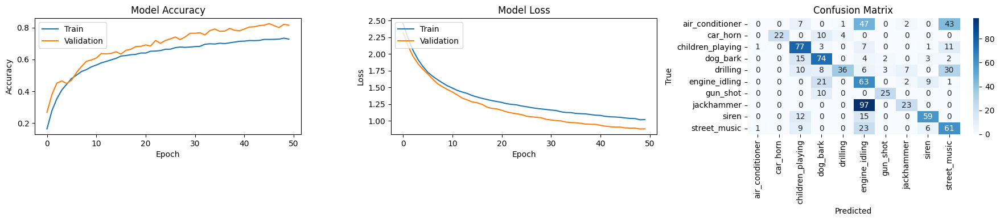

=== Fold 2 ===
Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.5573686957359314, 'loss': 1.5020400285720825, 'val_accuracy': 0.6183784008026123, 'val_loss': 1.3873616456985474}
Epoch 20/50 - {'accuracy': 0.6384497880935669, 'loss': 1.2792892456054688, 'val_accuracy': 0.699459433555603, 'val_loss': 1.1634109020233154}
Epoch 30/50 - {'accuracy': 0.6747832894325256, 'loss': 1.1662551164627075, 'val_accuracy': 0.707027018070221, 'val_loss': 1.076093316078186}
Epoch 40/50 - {'accuracy': 0.7044875025749207, 'loss': 1.0910874605178833, 'val_accuracy': 0.7405405640602112, 'val_loss': 0.998835027217865}
Epoch 50/50 - {'accuracy': 0.7261601090431213, 'loss': 1.0300531387329102, 'val_accuracy': 0.7762162089347839, 'val_loss': 0.9249096512794495}
Training completed.
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - accuracy: 0.5001 - loss: 1.7262
Test Loss: 1.5838, Test Accuracy: 53.49%
Example 0: Successfully fooled. True: 7

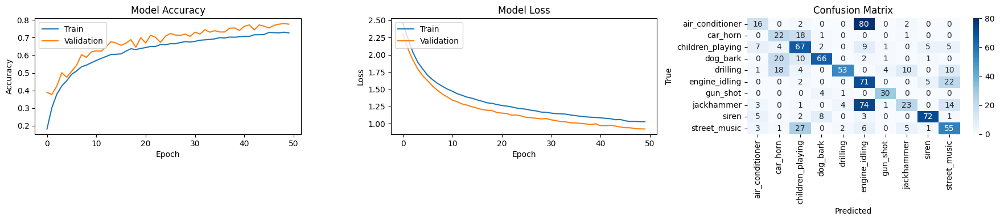

=== Fold 3 ===
Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.5528371930122375, 'loss': 1.518090844154358, 'val_accuracy': 0.6393939256668091, 'val_loss': 1.4364216327667236}
Epoch 20/50 - {'accuracy': 0.6472396850585938, 'loss': 1.2727816104888916, 'val_accuracy': 0.7111111283302307, 'val_loss': 1.2006112337112427}
Epoch 30/50 - {'accuracy': 0.6877161264419556, 'loss': 1.1433216333389282, 'val_accuracy': 0.7565656304359436, 'val_loss': 1.0712215900421143}
Epoch 40/50 - {'accuracy': 0.7156398296356201, 'loss': 1.0730695724487305, 'val_accuracy': 0.7787878513336182, 'val_loss': 0.9848982095718384}
Epoch 50/50 - {'accuracy': 0.7445881962776184, 'loss': 0.9935627579689026, 'val_accuracy': 0.7919191718101501, 'val_loss': 0.9199424386024475}
Training completed.
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - accuracy: 0.5533 - loss: 1.5022
Test Loss: 1.5974, Test Accuracy: 53.51%
Example 0: Successfully fooled. True

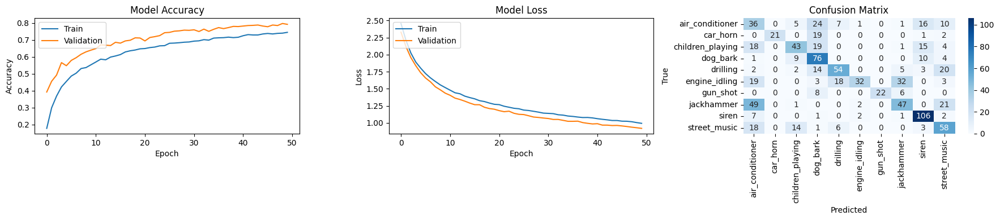

=== Fold 4 ===
Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.5415913462638855, 'loss': 1.5295445919036865, 'val_accuracy': 0.6164529919624329, 'val_loss': 1.3834205865859985}
Epoch 20/50 - {'accuracy': 0.6281322836875916, 'loss': 1.2853730916976929, 'val_accuracy': 0.69017094373703, 'val_loss': 1.1774733066558838}
Epoch 30/50 - {'accuracy': 0.6729527115821838, 'loss': 1.1650574207305908, 'val_accuracy': 0.7329059839248657, 'val_loss': 1.041576862335205}
Epoch 40/50 - {'accuracy': 0.7058899402618408, 'loss': 1.0815197229385376, 'val_accuracy': 0.7681623697280884, 'val_loss': 0.9698922634124756}
Epoch 50/50 - {'accuracy': 0.7301731109619141, 'loss': 1.0158878564834595, 'val_accuracy': 0.7831196784973145, 'val_loss': 0.9156480431556702}
Training completed.
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - accuracy: 0.5804 - loss: 1.5142
Test Loss: 1.4509, Test Accuracy: 60.81%
Example 0: Failed to fool. True: 3, Ad

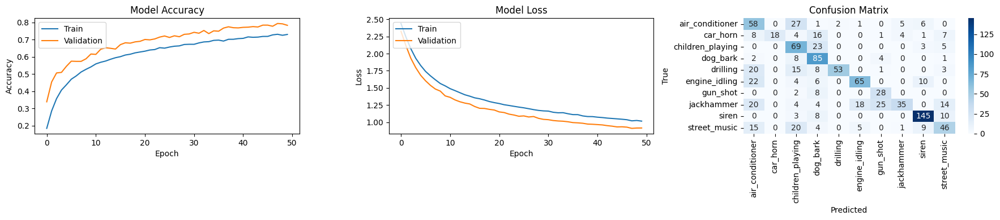

=== Fold 5 ===
Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.55259108543396, 'loss': 1.5152655839920044, 'val_accuracy': 0.5929526090621948, 'val_loss': 1.4981811046600342}
Epoch 20/50 - {'accuracy': 0.6459723114967346, 'loss': 1.2708930969238281, 'val_accuracy': 0.6318347454071045, 'val_loss': 1.3248279094696045}
Epoch 30/50 - {'accuracy': 0.6857362985610962, 'loss': 1.1541457176208496, 'val_accuracy': 0.6682867407798767, 'val_loss': 1.2213109731674194}
Epoch 40/50 - {'accuracy': 0.7156233787536621, 'loss': 1.0693824291229248, 'val_accuracy': 0.6974483728408813, 'val_loss': 1.1438852548599243}
Epoch 50/50 - {'accuracy': 0.7340943813323975, 'loss': 1.003015398979187, 'val_accuracy': 0.7290400862693787, 'val_loss': 1.0756405591964722}
Training completed.
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - accuracy: 0.5533 - loss: 1.4961
Test Loss: 1.4810, Test Accuracy: 54.59%
Example 0: Failed to fool. True: 0, Ad

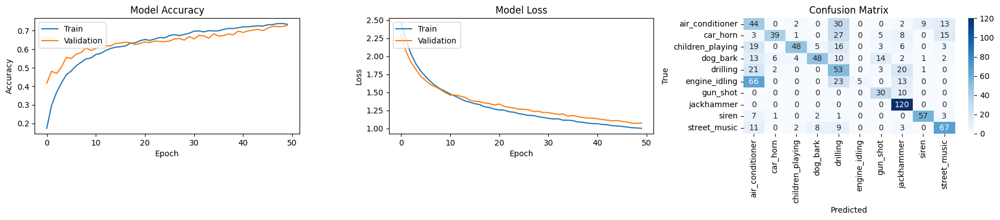

=== Fold 6 ===
Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.563535213470459, 'loss': 1.4876148700714111, 'val_accuracy': 0.5727923512458801, 'val_loss': 1.5192445516586304}
Epoch 20/50 - {'accuracy': 0.644961416721344, 'loss': 1.2566437721252441, 'val_accuracy': 0.681384265422821, 'val_loss': 1.2505826950073242}
Epoch 30/50 - {'accuracy': 0.6898469924926758, 'loss': 1.1411118507385254, 'val_accuracy': 0.7100238800048828, 'val_loss': 1.1046779155731201}
Epoch 40/50 - {'accuracy': 0.7124794721603394, 'loss': 1.0663045644760132, 'val_accuracy': 0.7756563425064087, 'val_loss': 1.012453556060791}
Epoch 50/50 - {'accuracy': 0.7458591461181641, 'loss': 0.9966861605644226, 'val_accuracy': 0.7923627495765686, 'val_loss': 0.9226484298706055}
Training completed.
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 313us/step - accuracy: 0.6482 - loss: 1.4799
Test Loss: 1.6655, Test Accuracy: 59.42%
Example 0: Successfully fooled. True: 3

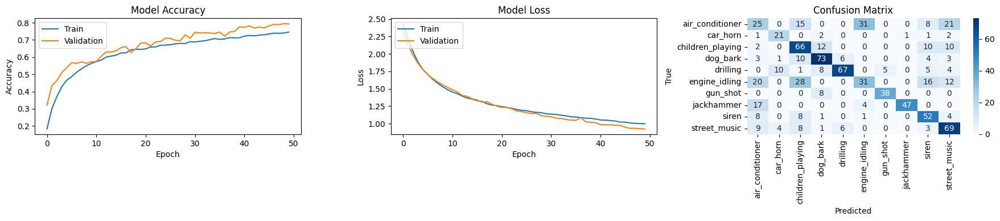

=== Fold 7 ===
Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.5576387047767639, 'loss': 1.4936063289642334, 'val_accuracy': 0.6848635077476501, 'val_loss': 1.3819894790649414}
Epoch 20/50 - {'accuracy': 0.6404864192008972, 'loss': 1.269049048423767, 'val_accuracy': 0.7233250737190247, 'val_loss': 1.2030631303787231}
Epoch 30/50 - {'accuracy': 0.677349865436554, 'loss': 1.1683635711669922, 'val_accuracy': 0.7245657444000244, 'val_loss': 1.1265571117401123}
Training completed.
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - accuracy: 0.5460 - loss: 1.5715
Test Loss: 1.5503, Test Accuracy: 56.68%
Example 0: Successfully fooled. True: 5, Adversarial: [9]
Example 1: Successfully fooled. True: 5, Adversarial: [2]
Example 2: Failed to fool. True: 5, Adversarial: [5]
Example 3: Successfully fooled. True: 7, Adversarial: [9]
Example 4: Successfully fooled. True: 4, Adversarial: [6]
Example 5: Failed to fool. True: 0, Ad

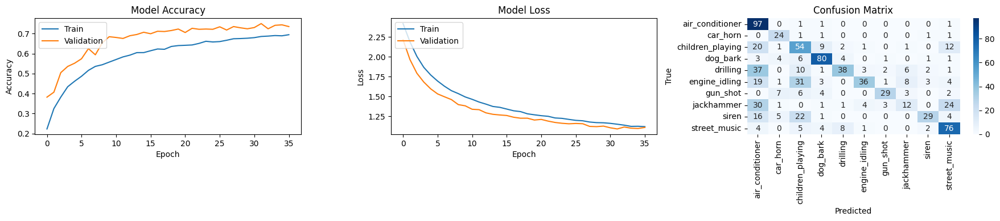

=== Fold 8 ===
Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.5534948110580444, 'loss': 1.5106598138809204, 'val_accuracy': 0.5784313678741455, 'val_loss': 1.4154239892959595}
Epoch 20/50 - {'accuracy': 0.6382790803909302, 'loss': 1.2707024812698364, 'val_accuracy': 0.6164215803146362, 'val_loss': 1.246485948562622}
Epoch 30/50 - {'accuracy': 0.6847085356712341, 'loss': 1.1484206914901733, 'val_accuracy': 0.6605392098426819, 'val_loss': 1.1265780925750732}
Epoch 40/50 - {'accuracy': 0.713853120803833, 'loss': 1.0675135850906372, 'val_accuracy': 0.7058823704719543, 'val_loss': 1.051039695739746}
Epoch 50/50 - {'accuracy': 0.7317688465118408, 'loss': 1.0034173727035522, 'val_accuracy': 0.7438725233078003, 'val_loss': 0.953423798084259}
Training completed.
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 571us/step - accuracy: 0.5588 - loss: 1.5396
Test Loss: 1.4693, Test Accuracy: 57.07%
Example 0: Successfully fooled. True: 9

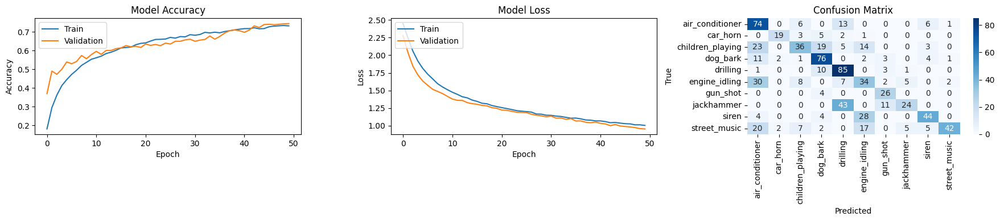

=== Fold 9 ===
Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.5605103373527527, 'loss': 1.499068260192871, 'val_accuracy': 0.6559139490127563, 'val_loss': 1.3723679780960083}
Epoch 20/50 - {'accuracy': 0.6474229693412781, 'loss': 1.2635066509246826, 'val_accuracy': 0.6833930611610413, 'val_loss': 1.1357197761535645}
Epoch 30/50 - {'accuracy': 0.6921424865722656, 'loss': 1.1408685445785522, 'val_accuracy': 0.7299880385398865, 'val_loss': 1.0348179340362549}
Epoch 40/50 - {'accuracy': 0.7176604270935059, 'loss': 1.0675110816955566, 'val_accuracy': 0.7622461318969727, 'val_loss': 0.9680461883544922}
Epoch 50/50 - {'accuracy': 0.733956515789032, 'loss': 1.0064048767089844, 'val_accuracy': 0.7694146037101746, 'val_loss': 0.9124419093132019}
Training completed.
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - accuracy: 0.4932 - loss: 1.8408
Test Loss: 1.8906, Test Accuracy: 51.23%
Example 0: Failed to fool. True: 7, A

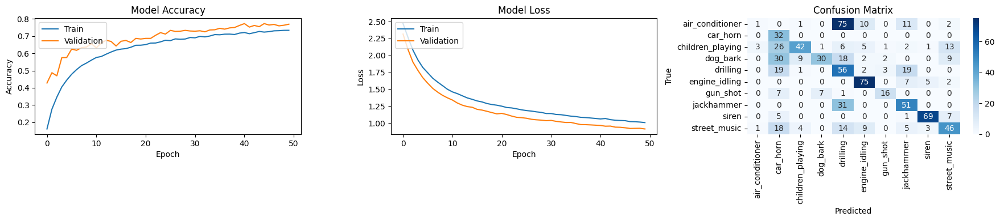

=== Fold 10 ===
Deep copy of the MLPClassifier instance created successfully.
Modelo MLP inicializado com sucesso.
Epoch 10/50 - {'accuracy': 0.6361941695213318, 'loss': 1.2805171012878418, 'val_accuracy': 0.750286340713501, 'val_loss': 1.0625613927841187}
Epoch 20/50 - {'accuracy': 0.701449453830719, 'loss': 1.091070294380188, 'val_accuracy': 0.7949599027633667, 'val_loss': 0.8909980058670044}
Epoch 30/50 - {'accuracy': 0.745534360408783, 'loss': 0.9763497114181519, 'val_accuracy': 0.8327605724334717, 'val_loss': 0.7679826617240906}
Epoch 40/50 - {'accuracy': 0.7757261991500854, 'loss': 0.8918388485908508, 'val_accuracy': 0.8613975048065186, 'val_loss': 0.688648521900177}
Epoch 50/50 - {'accuracy': 0.7978588938713074, 'loss': 0.8203870058059692, 'val_accuracy': 0.8682703375816345, 'val_loss': 0.6438702940940857}
Training completed.
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step - accuracy: 0.7656 - loss: 0.8884
Test Loss: 0.8694, Test Accuracy: 76.46%
Example 0: Successfully fooled. True: 3

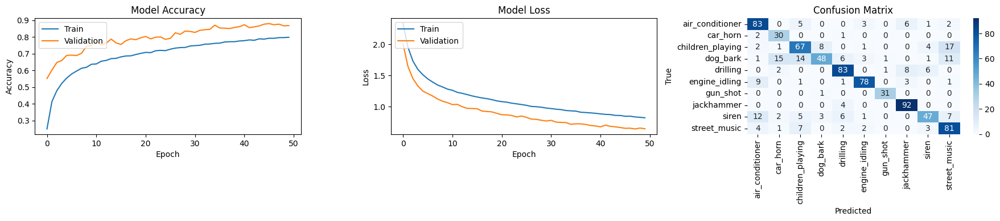

In [69]:
results_deepfool_mlp = cross_validation_mlp_deepfool(datasets, mlp, params=best_params)

In [70]:
accuracy_values_mlp, loss_values_mlp, robustness_values_mlp = results_deepfool_mlp
print("Average of the Accuracy values:", np.mean(accuracy_values_mlp))
print("Average of the Loss values:", np.mean(loss_values_mlp))
print("Average of the Robustness values:", np.mean(robustness_values_mlp))

Average of the Accuracy values: 0.5736678719520569
Average of the Loss values: 1.5285488665103912
Average of the Robustness values: 0.5630350927256499


**DeepFool on CNN**

[Back to DeepFool](#DeepFool)

In [84]:
def deepfool_cnn(model, x0, y0, max_iter=50, epsilon=1e-6):
    """    
    Args:
        model: A TensorFlow/Keras model.
        x0: The input image (numpy array of shape [H, W, C] or [1, H, W, C]).
        y0: The true label (integer).
        max_iter: Maximum number of iterations for the attack.
        epsilon: A small value to avoid division by zero.
    
    Returns:
        x_adv: The adversarial example.
    """
    x = tf.convert_to_tensor(x0, dtype=tf.float32)
    x_adv = tf.identity(x)  # Initialize adversarial example as the original input
    logits = model(x_adv)  # Get initial logits
    pred_label = tf.argmax(logits, axis=-1).numpy()[0]
    
    if pred_label != y0:
        return x0  # If already misclassified, return the original input

    # Iterative DeepFool
    for i in range(max_iter):
        with tf.GradientTape() as tape:
            tape.watch(x_adv)
            logits = model(x_adv)  # Shape: (1, num_classes)
        
        gradients = tape.gradient(logits, x_adv)  # Shape: (1, H, W, C)
        logits = logits.numpy()[0]  # Convert logits to 1D array (num_classes)
        gradients = gradients.numpy()  # Convert gradients to numpy array

        current_label = np.argmax(logits)
        if current_label != y0:
            break  # Stop if misclassified

        # Compute perturbation for each class
        w = gradients[0] - gradients[0][y0]  # Fix shape mismatch
        f = logits - logits[y0]

        perturbations = []
        for k in range(len(logits)):  # Iterate over all classes
            if k != y0:
                # Avoid division by zero in norm calculation
                norm_w_k = np.linalg.norm(w[k].flatten()) + epsilon
                perturbations.append((abs(f[k]) / norm_w_k, k))
        
        # Find the closest class decision boundary
        perturbations.sort()
        r_min, k_min = perturbations[0]

        # Apply the perturbation
        x_adv = x_adv + (1 + epsilon) * tf.convert_to_tensor(r_min * w[k_min], dtype=tf.float32)

    return x_adv.numpy()


def cross_validation_cnn_deepfool(folds_data, best_params):
    accuracy_values = []
    loss_values = []
    robustness_values = []
    best_val_acc = 0
    fold_names = list(folds_data.keys())  # Obter as chaves do dicionário

    for i, test_fold_name in enumerate(fold_names):
        print(f"=== Iteração {i+1} ===")
        test_set = folds_data[test_fold_name]
        val_fold_name = fold_names[(i + 1) % len(fold_names)]
        validation_set = folds_data[val_fold_name]

        # Prepare training data
        train_fold_names = [name for name in fold_names if name != test_fold_name and name != val_fold_name]
        train_spectrograms = np.concatenate([folds_data[name][0] for name in train_fold_names])
        train_labels = np.concatenate([folds_data[name][1] for name in train_fold_names])

        X_train, y_train = train_spectrograms, train_labels
        X_val, y_val = validation_set
        X_test, y_test = test_set

        # Normalize and resize data
        X_train = normalize_and_resize(X_train)
        X_val = normalize_and_resize(X_val)
        X_test = normalize_and_resize(X_test)

        # # Tune hyperparameters for the first iteration
        # if i == 0 and best_params is None:
        #     param_grid = ParameterGrid(params)

        #     for param in param_grid:
        #         print("Testing with parameters: ", param)

        #         cnn = CNN_TF.CNN_Class(input_shape=X_train.shape[1:], num_classes=len(np.unique(y_train)))

        #         cnn.initialize_model(param)
        #         history = cnn.trainar(
        #             train_data=X_train,
        #             train_labels=y_train,
        #             validation_data=(X_val, y_val),
        #             epochs=param['epochs'],
        #             batch_size=param['batch_size']
        #         )
        #         val_loss, val_acc = cnn.evaluate(X_val, y_val)
        #         if val_acc > best_val_acc:
        #             best_val_acc = val_acc
        #             best_params = param

        # Train the final model with the best parameters
        cnn = CNN_TF.CNN_Class(input_shape=X_train.shape[1:], num_classes=len(np.unique(y_train)))
        cnn.initialize_model(best_params)
        history = cnn.trainar(
            train_data=X_train,
            train_labels=y_train,
            validation_data=(X_val, y_val),
            epochs=best_params['epochs'],
            batch_size=best_params['batch_size']
        )

        # Evaluate on the test set
        fold_loss, fold_accuracy = cnn.evaluate(X_test, y_test)
        accuracy_values.append(fold_accuracy)
        loss_values.append(fold_loss)

        # Initialize a new list for adversarial examples in each fold
        adversarial_examples = []  

        # Apply DeepFool
        for j in range(len(X_test)):  # Loop over test examples
            x0 = X_test[j:j+1]  # Get a single test example
            y0 = y_test[j]      # True label for this example

            print(f"x0 shape: {x0.shape}, y0: {y0}, model output shape: {cnn.model.output_shape}")

            try:
                # Generate adversarial example
                x_adv = deepfool_cnn(cnn.model, x0, y0)  # Call the manual DeepFool function
                adversarial_examples.append(x_adv)  # Append to the list

                # Evaluate robustness
                adv_pred = np.argmax(cnn.model(x_adv).numpy(), axis=-1)
                if adv_pred != y0:
                    print(f"Example {j}: Successfully fooled. True Label: {y0}, Adversarial Label: {adv_pred}")
                else:
                    print(f"Example {j}: Failed to fool. True Label: {y0}, Adversarial Label: {adv_pred}")

            except ValueError as e:
                print(f"DeepFool error on example {j}: {e}")
                continue

        # Convert adversarial_examples to numpy array only after the loop
        adversarial_examples_ok = np.array(adversarial_examples)

        # Calculate adversarial accuracy
        adv_correct = 0
        for adv_x, true_y in zip(adversarial_examples_ok, y_test):
            adv_pred = np.argmax(cnn.model(adv_x).numpy(), axis=-1)
            if adv_pred == true_y:
                adv_correct += 1

        robustness_accuracy = adv_correct / len(y_test)
        robustness_values.append(robustness_accuracy)
        print(f"Robustness Accuracy: {robustness_accuracy}")

    return accuracy_values, loss_values, robustness_values



In [85]:
best_params_mel = {'batch_size': 64, 'dense_units': 128, 'dropout_rate': 0.5, 'epochs': 20, 'filters': 32, 'kernel_size': 5, 'learning_rate': 0.0001, 'num_conv_layers': 2}

In [86]:
results_deepfool_cnn = cross_validation_cnn_deepfool(folds_data_mel, best_params_mel)

=== Iteração 1 ===


/opt/homebrew/Caskroom/miniconda/base/envs/sound_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Shape após Flatten: (None, 88064)

Epoch 1: val_loss improved from inf to 1.26571, saving model to model_fold_checkpoint.keras
Epoch 1/20 - {'accuracy': 0.3875217139720917, 'loss': 1.6629080772399902, 'val_accuracy': 0.5608974099159241, 'val_loss': 1.265708327293396}

Epoch 2: val_loss improved from 1.26571 to 1.00620, saving model to model_fold_checkpoint.keras
Epoch 2/20 - {'accuracy': 0.5843949317932129, 'loss': 1.2054011821746826, 'val_accuracy': 0.6858974099159241, 'val_loss': 1.0062013864517212}

Epoch 3: val_loss improved from 1.00620 to 0.92036, saving model to model_fold_checkpoint.keras
Epoch 3/20 - {'accuracy': 0.6700926423072815, 'loss': 0.9836128950119019, 'val_accuracy': 0.7168803215026855, 'val_loss': 0.9203623533248901}

Epoch 4: val_loss improved from 0.92036 to 0.86409, saving model to model_fold_checkpoint.keras
Epoch 4/20 - {'accuracy': 0.7265489101409912, 'loss': 0.8239152431488037, 'val_accuracy': 0.7126068472862244, 'val_loss': 0.8640850186347961}

Epoch 5: val_l

In [ ]:
accuracy_values_cnn, loss_values_cnn, robustness_values_cnn = results_deepfool_cnn
print("Average of the Accuracy values:", np.mean(accuracy_values_cnn))
print("Average of the Loss values:", np.mean(loss_values_cnn))
print("Average of the Robustness values:", np.mean(robustness_values_cnn))

In [ ]:
accuracy_values_deepfool_cnn = [0.6204954981803894, 0.7339743375778198, 0.5696969628334045, 0.5632432699203491, 0.6327543258666992, 0.5504252910614014, 0.6139748096466064, 0.5859188437461853, 0.6421568393707275, 0.6762245893478394]
robustness_values_deepfool_cnn = [0.6204954954954955, 0.7339743589743589, 0.5696969696969697, 0.5632432432432433, 0.6327543424317618, 0.5504252733900364, 0.6139747995418099, 0.5859188544152745, 0.6421568627450981, 0.6762246117084827]
average_acc =  0.6188864767551422
average_robustness =  0.618886481164253

#### **Results and Analysis**

**Hyperparameters**

In [87]:
params_mlp = {
    'Parameter': [
        'Hidden Layers',
        'Learning Rate',
        'Dropout Rate',
        'Optimizer',
        'Epochs',
        'Batch Size',
        'L2 Lambda'
    ],
    'Values': [
        ['[128, 64]', '[256, 128]', '[512, 256, 128]', '[256, 128, 64]', '[128, 64, 32]'],
        ['0.001', '0.0001', '0.00001'],
        ['0.2', '0.3', '0.5'],
        ['Adam'],
        ['50'],
        ['256', '32'],
        ['0.001', '0.01', '0.1']
    ]
}

df_params_mlp = pd.DataFrame(params_mlp)
df_params_mlp

,Parameter,Values
0,Hidden Layers,"[[128, 64], [256, 128], [512, 256, 128], [256,..."
1,Learning Rate,"[0.001, 0.0001, 0.00001]"
2,Dropout Rate,"[0.2, 0.3, 0.5]"
3,Optimizer,[Adam]
4,Epochs,[50]
5,Batch Size,"[256, 32]"
6,L2 Lambda,"[0.001, 0.01, 0.1]"


In [88]:
params_cnn = {
    'Parameter': [
        'Number of Convolutional Layers',
        'Filters',
        'Kernel Size',
        'Dense Units',
        'Dropout Rate',
        'Learning Rate',
        'Batch Size',
        'Epochs'
    ],
    'Values': [
        ['2', '3'],
        ['32', '64'],
        ['5'],
        ['128', '256'],
        ['0.5'],
        ['0.01', '0.001', '0.0001'],
        ['32', '64'],
        ['20']
    ]
}

df_params_cnn = pd.DataFrame(params_cnn)
df_params_cnn

,Parameter,Values
0,Number of Convolutional Layers,"[2, 3]"
1,Filters,"[32, 64]"
2,Kernel Size,[5]
3,Dense Units,"[128, 256]"
4,Dropout Rate,[0.5]
5,Learning Rate,"[0.01, 0.001, 0.0001]"
6,Batch Size,"[32, 64]"
7,Epochs,[20]


The hyperparameter configurations for the MLP and CNN models were carefully designed to explore a wide range of architectural and training options. For the MLP, the parameters include various hidden layer configurations, learning rates, dropout rates, L2 regularization values, batch sizes, and the Adam optimizer, allowing for flexibility in capturing complex patterns in the data. Similarly, the CNN parameters cover different numbers of convolutional layers, filter sizes, dense layer units, dropout rates, and learning rates, providing a robust foundation for feature extraction and classification. These configurations aim to identify the optimal combination of settings to maximize model performance on the UrbanSound8K dataset.

**Metrics values**

In [ ]:
data = {
    "Model": ["MLP", "CNN (Mel Spectrogram)", "CNN (MFCC)", "CNN (Chroma)"],
    "Accuracy (Avg)": [
        sum(accuracy_values_mlp) / len(accuracy_values_mlp),
        sum(accuracy_values_mel) / len(accuracy_values_mel),
        sum(accuracy_values_mfcc) / len(accuracy_values_mfcc),
        sum(accuracy_values_chroma) / len(accuracy_values_chroma),
    ],
    "Loss (Avg)": [
        sum(loss_values_mlp) / len(loss_values_mlp),
        sum(loss_values_mel) / len(loss_values_mel),
        sum(loss_values_mfcc) / len(loss_values_mfcc),
        sum(loss_values_chroma) / len(loss_values_chroma),
    ],
}

df = pd.DataFrame(data)
df


,Model,Accuracy (Avg),Loss (Avg)
0,MLP,0.569109,1.530821
1,CNN (Mel Spectrogram),0.635576,1.105425
2,CNN (MFCC),0.606954,1.261025
3,CNN (Chroma),0.488868,1.620720


As predicted by our hypothesis, the CNN models achieved better results than the MLP model, except for the CNN model that uses chroma features. Among the CNN architectures, the one using mel spectrograms consistently outperformed the others, demonstrating superior classification accuracy across all experiments. This indicates that mel spectrogram features are particularly well-suited for capturing the relevant characteristics of urban sound data.

#### **References**

- https://www.justinsalamon.com/uploads/4/3/9/4/4394963/salamon_urbansound_acmmm14.pdf

- https://github.com/tomfran/urban-sound-classification/blob/main/notebooks/01_dataset.ipynb

- https://www.kaggle.com/code/prabhavsingh/urbansound8k-classification/notebook

- https://openaccess.thecvf.com/content_cvpr_2016/papers/Moosavi-Dezfooli_DeepFool_A_Simple_CVPR_2016_paper.pdf